# **Explore Air Quality Data for Mexico**

 Our objective is to gain insights into air pollution trends and assess the impact of different pollutants on air quality across different regions.

 We will perform exploratory data analysis (EDA) to uncover patterns and trends, visualize key metrics, and identify potential correlations between different pollutants and meteorological variables. By the end of this notebook, you'll gain a comprehensive understanding of Mexico's air quality and its variations.


# About the Dataset



In [67]:
import numpy as np
import pandas as pd

In [72]:

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import altair as alt
plt.style.use('ggplot')

In [100]:
df=pd.read_csv('/content/sample_data/mer_imputed_merged_data.csv') # Replace this with path to your csv file
df.head(5)

,datetime,direct_radiation (W/m²),PM25_MER,PM10_MER,SO2_MER,O3_MER,NO2_MER,CO_MER,RH_MER,TMP_MER,WDR_MER,WSP_MER,is_festival,is_weekend,AirQualityIndex
0,2020-11-25 01:00:00,0,35.0,72.0,8.0,1.0,47.0,1.8,44.0,15.6,256.0,0.5,0,0,4
1,2020-11-25 02:00:00,0,43.0,73.0,7.0,1.0,43.0,1.3,47.0,15.0,296.0,0.7,0,0,4
2,2020-11-25 03:00:00,0,37.0,60.0,6.0,1.0,39.0,0.9,49.0,14.4,302.0,0.5,0,0,4
3,2020-11-25 04:00:00,0,34.0,51.0,4.0,1.0,37.0,0.4,51.0,13.6,320.0,0.7,0,0,4
4,2020-11-25 05:00:00,0,28.0,59.0,5.0,1.0,40.0,0.7,56.0,12.6,90.0,1.2,0,0,4


## **Exploratory Data Analysis**

This notebook will explore the descriptive statistics and Visualization tasks from the project tracker. Below are some of the tasks we will be looking into


* **Univariate Analysis:** Explore and visualize individual features in the dataset to understand their distributions and statistics.
* **Bivariate Analysis:** Analyze the relationships between two features to uncover potential correlations or patterns.
* **Multivariate Analysis:** Examine interactions among multiple features to identify complex patterns and insights.
* **Time Series Analysis:** Investigate how air quality measurements change over time and identify any trends or seasonal effects.
* **Outlier Analysis:** Investigate how air quality measurements change over time and identify any trends or seasonal effects.
* **Conclusion:** Summarize the findings from the analysis, highlight key insights, and suggest potential actions or further research.



## **Univariate Analysis of Air Quality Metrics**

In this section, we will delve into the univariate analysis of the key air quality metrics in our dataset. The goal is to gain a deeper understanding of the distribution and characteristics of each variable individually. We will use various types of visualizations to achieve this:

***Histogram:*** To examine the frequency distribution of each air quality metric, providing insights into the overall spread and common values.
***Violin Plot:*** To visualize the distribution of each variable, highlighting the density and potential multi-modality of the data.

***Box Plot:*** To identify the central tendency, spread, and outliers in the data, giving a clear picture of the variability and extremes.

***Bar Plot:*** To summarize the mean values of the air quality metrics, enabling a straightforward comparison between different variables.


These visualizations will help us to better understand the data and inform further analysis steps. Each plot type provides unique insights into the dataset, enabling us to explore patterns and anomalies effectively.

**1. Histogram**

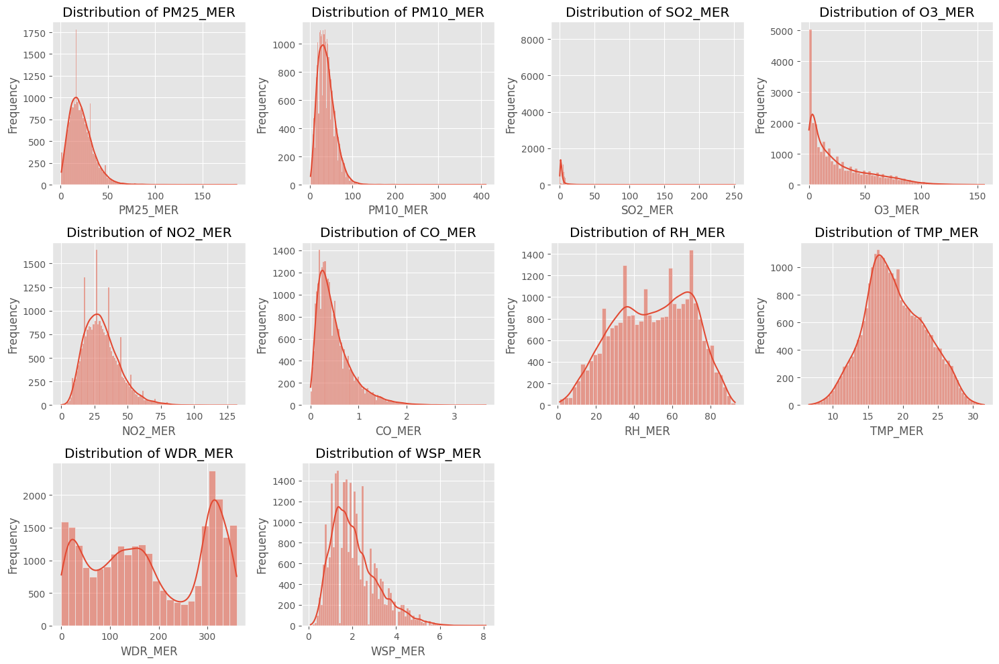

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select pollutant and meteorological columns for the histogram
pollutant_columns = ['PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER']
meteorological_columns = ['RH_MER', 'TMP_MER', 'WDR_MER', 'WSP_MER']
columns_to_plot = pollutant_columns + meteorological_columns

# Create the histograms
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_plot):
    plt.subplot(3, 4, i + 1)  # Adjust the subplot grid as needed
    sns.histplot(df[col], kde=True)  # Use kde=True for density curve
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [5]:
columns_to_analyze = ['PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER', 'RH_MER', 'TMP_MER', 'WDR_MER', 'WSP_MER', 'is_festival', 'is_weekend']


**2. Violin Plots**

In [ ]:
colors = [
    'rgb(31, 119, 180)',
    'rgb(255, 127, 14)',
    'rgb(44, 160, 44)',
    'rgb(214, 39, 40)',
    'rgb(148, 103, 189)',
    'rgb(140, 86, 75)',
    'rgb(227, 119, 194)',
    'rgb(127, 127, 127)',
    'rgb(188, 189, 34)', 'rgb(0, 128, 0)',
    'rgb(128, 0, 128)',
    'rgb(0, 0, 128)']


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()


for i, column in enumerate(columns_to_analyze):
    fig.add_trace(go.Violin(
        y=df[column],
        name=column,
        box_visible=True,
        meanline_visible=True,
        fillcolor=colors[i],
        line_color='rgb(8,48,107)'
    ))


fig.update_layout(
    title='Violin Plots of Pollutants and Meteorological Data',
    yaxis_title='Value',
    template='plotly_white',
    font=dict(size=15),
    title_font=dict(size=20, family='Arial'),
    plot_bgcolor='rgb(240,240,240)',
    paper_bgcolor='rgb(255,255,255)',
    margin=dict(l=40, r=40, t=40, b=40)
)

fig.show()

**3. Box Plots**

In [ ]:
fig = go.Figure()

# Add box plots with customized colors
for i, column in enumerate(columns_to_analyze):
    fig.add_trace(go.Box(
        y=df[column],
        name=column,
        boxmean=True,
        marker=dict(color=colors[i], line=dict(width=1)),
        fillcolor=colors[i],
        line_color='rgb(8,48,107)'
    ))

# Update layout with a more beautiful design
fig.update_layout(
    title='Box Plots of Pollutants and Meteorological Data',
    yaxis_title='Value',
    template='plotly_white',
    font=dict(size=15),
    title_font=dict(size=20, family='Arial'),
    plot_bgcolor='rgb(240,240,240)',
    paper_bgcolor='rgb(255,255,255)',
    margin=dict(l=40, r=40, t=40, b=40)
)

fig.show()

**4. Bar Plot**

***Mean and Standard Deviation of Pollutants and Meteorological Data***

In [ ]:
import plotly.express as px
# Example data for bar plot (replace with actual summary statistics)
bar_data = df.drop('datetime',axis=1).describe().transpose().reset_index()
bar_data = bar_data[['index', 'mean', 'std']].rename(columns={'index': 'Feature'})
fig = px.bar(
    bar_data,
    x='Feature',
    y='mean',
    error_y='std',
    color='Feature',
    color_discrete_sequence=colors,
    title='Mean and Standard Deviation of Pollutants and Meteorological Data'
)
fig.update_layout(
    template='plotly_white',
    font=dict(size=15),
    title_font=dict(size=20, family='Arial'),
    plot_bgcolor='rgb(240,240,240)',
    paper_bgcolor='rgb(255,255,255)',
    margin=dict(l=40, r=40, t=40, b=40)
)
fig.show()

**5. Histogram and Box-plot**

***Distribution of Individual plot of Pollutants and Meteorological Data Using***

In [ ]:
import plotly.subplots as sp
# Create subplots
fig = sp.make_subplots(rows=4, cols=3, subplot_titles=columns_to_analyze, vertical_spacing=0.1, horizontal_spacing=0.1)
# Add histograms to subplots
for i, column in enumerate(columns_to_analyze):
    fig.add_trace(go.Histogram(
        x=df[column],
        name=column,
        opacity=0.75,
        histnorm='density',
        marker=dict(line=dict(width=0.5)),
    ), row=(i//3)+1, col=(i%3)+1)
# Update layout for histograms
fig.update_layout(
    title_text='Distribution of Pollutants and Meteorological Data',
    showlegend=False,
    template='plotly_white',
    height=900,
    width=1200
)
fig.show()
# Create subplots
fig = sp.make_subplots(rows=4, cols=3, subplot_titles=columns_to_analyze, vertical_spacing=0.1, horizontal_spacing=0.1)
# Add box plots to subplots
for i, column in enumerate(columns_to_analyze):
    fig.add_trace(go.Box(
        y=df[column],
        name=column,
        boxmean=True,
        marker=dict(line=dict(width=1))
    ), row=(i//3)+1, col=(i%3)+1)
# Update layout for box plots
fig.update_layout(
    title_text='Box Plots of Pollutants and Meteorological Data',
    showlegend=False,
    template='plotly_white',
    height=900,
    width=1200
)
fig.show()

 ***Analyze seasonal and hourly patterns***

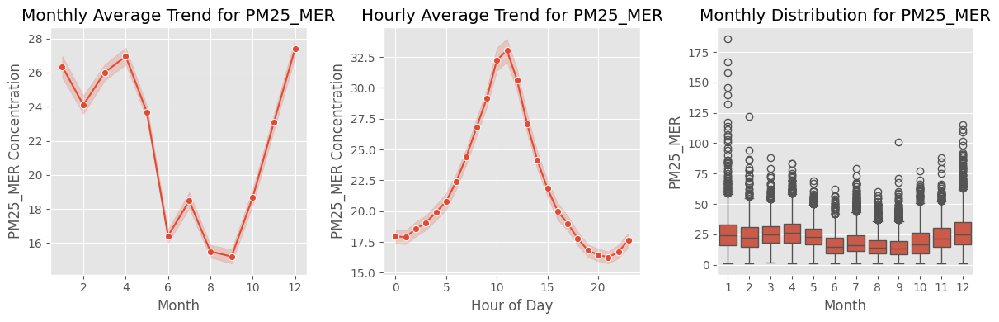

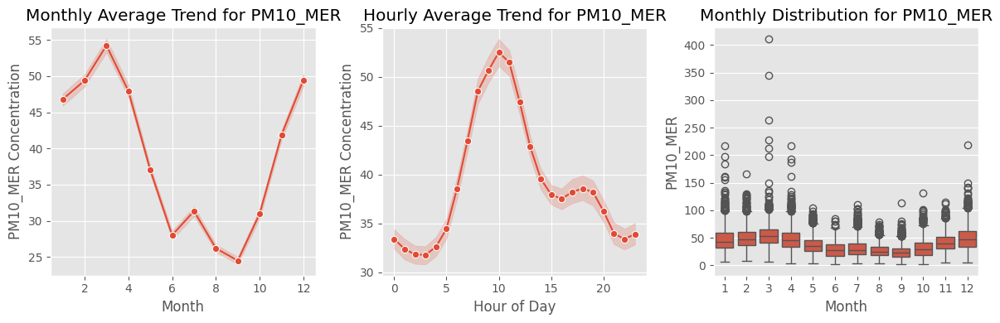

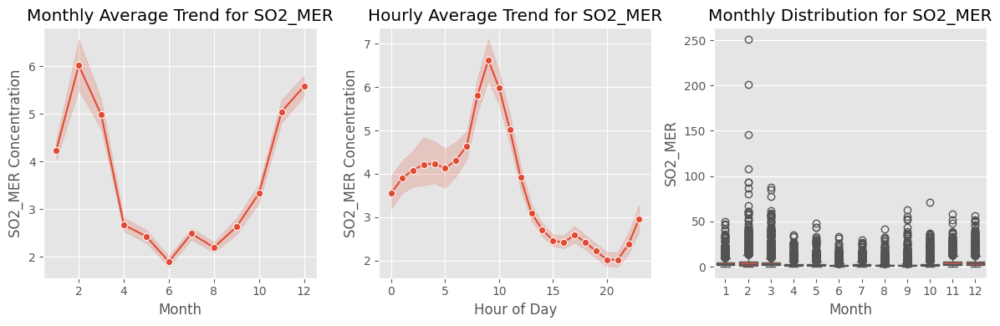

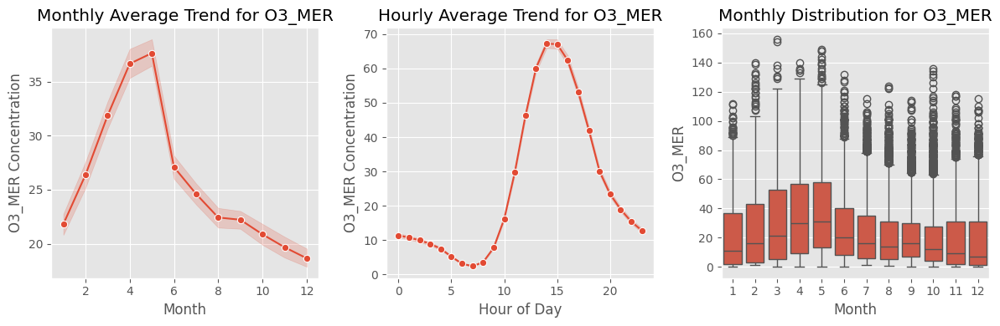

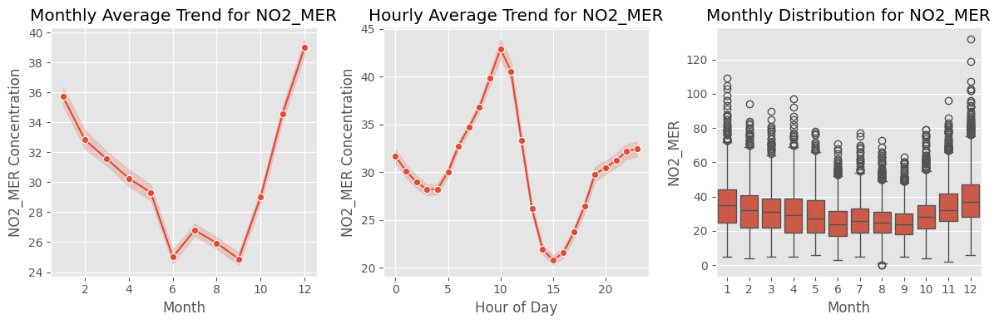

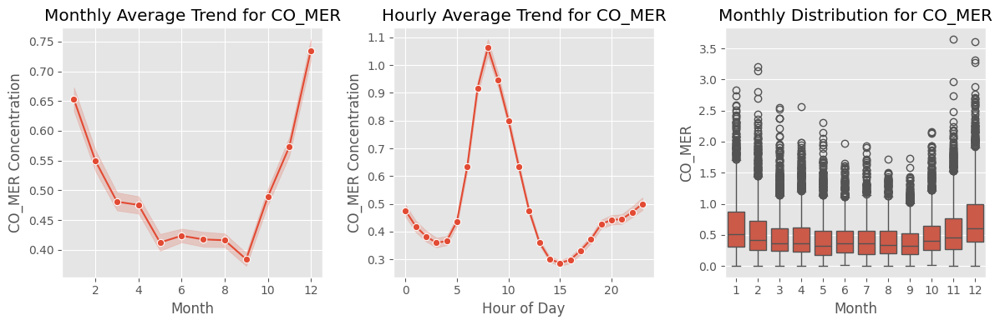

In [8]:

def seasonal_hourly_and_monthly_analysis(df):
    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    df['month'] = df['datetime'].dt.month
    df['hour'] = df['datetime'].dt.hour

    pollutants = ['PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER']
    for pollutant in pollutants:
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))  # 3 plots in a row, reduced figsize

        sns.lineplot(x='month', y=pollutant, data=df, marker="o", ax=axes[0])
        axes[0].set_title(f"Monthly Average Trend for {pollutant}")
        axes[0].set_xlabel("Month")
        axes[0].set_ylabel(f"{pollutant} Concentration")

        sns.lineplot(x='hour', y=pollutant, data=df, marker="o", ax=axes[1])
        axes[1].set_title(f"Hourly Average Trend for {pollutant}")
        axes[1].set_xlabel("Hour of Day")
        axes[1].set_ylabel(f"{pollutant} Concentration")

        sns.boxplot(x='month', y=pollutant, data=df, ax=axes[2])  # Adding a boxplot for monthly variation
        axes[2].set_title(f"Monthly Distribution for {pollutant}")
        axes[2].set_xlabel("Month")

        plt.tight_layout()
        plt.show()



seasonal_hourly_and_monthly_analysis(df)

**Summary of the univariate analysis** - Angela Shakya

| **Variable**   | **Stats & Distribution**                                                                                                                                | **Key Insights**                                                                                                                                                                                                                                                 |
|----------------|---------------------------------------------------------------------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **PM25_MER**   | - **Mean**: 21.93<br>- **Median**: 20<br>- **IQR**: 13–29<br>- **Range**: ~10–175 (outliers above ~53)<br>- **Distribution**: Right-skewed                                                     | - Most values in 10–30 range<br>- Occasional high spikes up to 175<br>- Moderate pollution most of the time, but infrequent high pollution events<br>- Highlights need to address spikes from industrial/traffic emissions                                       |
| **PM10_MER**   | - **Mean**: 39.13<br>- **Median**: 36<br>- **IQR**: 24–51<br>- **Range**: ~10–400 (outliers above ~91.5)<br>- **Distribution**: Right-skewed                                                   | - Frequent moderate levels (30–50)<br>- Rare but significant pollution spikes up to 400<br>- Larger range and more frequent extremes compared to PM2.5<br>- Emphasizes monitoring/mitigation of high-pollution events (construction, heavy traffic, industrial) |
| **O3_MER**     | - **Mean**: 25.62<br>- **Median**: 16<br>- **IQR**: 4–40<br>- **Range**: ~0–160 (outliers above ~94)<br>- **Distribution**: Right-skewed                                                       | - Most values under 50<br>- Occasional spikes up to 160<br>- Driven by photochemical reactions (sunlight + emissions)<br>- High levels (>94) may pose respiratory risks and form smog                                                                              |
| **SO2_MER**    | - **Mean**: 3.65<br>- **Median**: 2<br>- **IQR**: 1–4<br>- **Range**: ~0–250 (outliers above ~8.5)<br>- **Distribution**: Heavily right-skewed                                                 | - Typically very low (near 0)<br>- Occasional extreme spikes (up to 250)<br>- Indicates industrial or high-sulfur fuel combustion<br>- Monitoring needed for sporadic high-emission events                                                                        |
| **NO2_MER**    | - **Mean**: 30.60<br>- **Median**: 29<br>- **IQR**: 21–38<br>- **Range**: ~0–120 (outliers above ~63.5)<br>- **Distribution**: Moderately right-skewed                                         | - Most values 20–40<br>- Spikes up to 120 (likely traffic/industrial sources)<br>- Elevated levels (>63.5) pose respiratory risks<br>- Important for urban pollution control                                                                                     |
| **CO_MER**     | - **Mean**: 0.50<br>- **Median**: 0.4<br>- **IQR**: 0.24–0.67<br>- **Range**: ~0–3.5 (outliers above ~1.31)<br>- **Distribution**: Right-skewed                                                | - Low baseline (0–1.0) <br>- Occasional spikes up to 3.5<br>- Primarily from vehicle or industrial emissions<br>- Generally safe levels but requires monitoring in high-traffic zones                                                                            |
| **RH_MER**     | - **Mean**: 49.90<br>- **Median**: 51<br>- **IQR**: 34–67<br>- **Range**: 0–100<br>- **Distribution**: Slightly bimodal (peaks ~40–50 and 60–70)                                               | - No major outliers<br>- Typical clustering in 40–70<br>- Bimodal nature suggests distinct seasonal/humidity regimes<br>- Stable, consistent range important for weather/environmental assessments                                                               |
| **TMP_MER**    | - **Mean**: 18.84<br>- **Median**: 18.4<br>- **IQR**: 15.82–21.9<br>- **Range**: ~5–32 (outliers <10 or >30)<br>- **Distribution**: Nearly bell-shaped, slight normality                          | - Most values near 18–20<br>- Rare extremes (<10 or >30)<br>- Suggests a temperate climate<br>- Symmetry indicates stable temperature patterns                                                                                                                    |
| **WDR_MER**    | - **Mean**: 184.42<br>- **Median**: 170<br>- **IQR**: 84–306<br>- **Range**: 0–360<br>- **Distribution**: Multi-modal (peaks around 50–100, 150, 250–300)                                       | - Wind directions cluster at specific angles<br>- No outliers since 0–360 is valid range<br>- Dominant wind directions important for pollution transport & wind energy planning<br>- Reflects local geography/seasonal patterns                                    |
| **WSP_MER**    | - **Mean**: 2.10<br>- **Median**: 1.9<br>- **IQR**: 1.3–2.7<br>- **Range**: 0–8 (outliers above 4)<br>- **Distribution**: Right-skewed                                                          | - Calm to moderate speeds (0–2) common<br>- Occasional strong winds up to 8<br>- Useful for predicting pollutant dispersion<br>- Planning for rare high-wind events (infrastructure, safety)                                                                      |
| **is_festival**| - **Binary**: 0 or 1<br>- **0**: 25,442 (95%); **1**: 1,346 (5%)<br>- Highly imbalanced variable                                                                                                 | - Significantly fewer festival days<br>- May need special handling in models (resampling/weighting)<br>- Potential for unique pollution/traffic patterns on festival days                                                                                       |
| **is_weekend** | - **Binary**: 0 or 1<br>- **0**: 19,154 (~71.5%); **1**: 7,634 (~28.5%)<br>- More balanced than is_festival                                                                                     | - Allows analysis of weekday vs. weekend trends<br>- Could correlate with traffic or pollution differences                                                                                                                 |
| **AirQualityIndex** | - **Categorical** (1–5):<br> 1 (Good), 2 (Acceptable), 3 (Bad), 4 (Very Bad), 5 (Extremely Bad)<br>- **Distribution**: 4 (Very Bad) is most frequent; 1 (Good) least frequent              | - Levels 4 and 2 together ~40.8% (dominant)<br>- Fairly even spread across categories, but skewed toward worse quality<br>- Rare “Good” air days<br>- Highlights concern for moderate-to-very-bad air quality                                                      |
| **direct_radiation** | - **Heavily right-skewed**<br>- Most values near 0 W/m²<br>- Narrow IQR, with a long tail of outliers                                                                                      | - Sharp peak at low radiation<br>- Occasional high spikes, possibly weather-driven<br>- Outliers require further investigation (could be intense sun or measurement anomalies)                                                                                  |


## **Bivariate Analysis**
By Aisha and Eyosias

In this section, we will perform bivariate analysis by visualizing the correlations between various columns in our dataset. We have used scatter plots and Pearson & Spearman correlation test between pairs of variables. This analysis helps us understand how different features interact with each other, which can provide valuable insights into the underlying data patterns and inform our modeling approach.

**1. Relation between Key Pollutants and Meteorological Features**

In [50]:
corr_matrix = df[['TMP_MER', 'O3_MER']].corr()
corr_matrix

,TMP_MER,O3_MER
TMP_MER,1.000000,0.786092
O3_MER,0.786092,1.000000


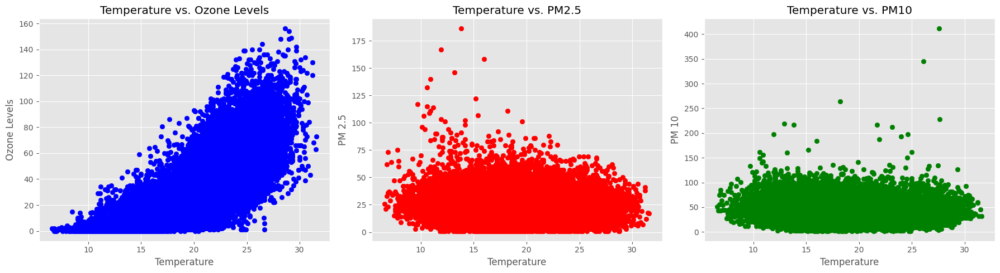

In [52]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Temperature vs Ozone Levels
axes[0].scatter(df['TMP_MER'], df['O3_MER'], color='blue', label='Ozone Levels')
axes[0].set_xlabel("Temperature")
axes[0].set_ylabel("Ozone Levels")
axes[0].set_title("Temperature vs. Ozone Levels")

# Plot 2: Temperature vs PM2.5 Levels
axes[1].scatter(df['TMP_MER'], df['PM25_MER'], color='red', label='PM2.5 Levels')
axes[1].set_xlabel("Temperature")
axes[1].set_ylabel("PM 2.5")
axes[1].set_title("Temperature vs. PM2.5")

# Plot 3: Temperature vs PM10 Levels
axes[2].scatter(df['TMP_MER'], df['PM10_MER'], color='green', label='PM10 Levels')
axes[2].set_xlabel("Temperature")
axes[2].set_ylabel("PM 10")
axes[2].set_title("Temperature vs. PM10")

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

**2. Pearson & Spearman Correlation Tests**

In [53]:
from scipy.stats import pearsonr, spearmanr

# Define feature pairs
feature_pairs = [
    ('PM25_MER', 'PM10_MER'),
    ('PM10_MER', 'O3_MER'),
    ('RH_MER', 'TMP_MER'),
    ('RH_MER', 'WSP_MER'),
    ('NO2_MER', 'PM25_MER'),
    ('NO2_MER', 'PM10_MER'),
    ('SO2_MER', 'PM25_MER'),
    ('WDR_MER', 'WSP_MER')
]

# Compute Pearson and Spearman correlations
for x, y in feature_pairs:
    pearson_corr, p_pearson = pearsonr(df[x], df[y])
    spearman_corr, p_spearman = spearmanr(df[x], df[y])

    print(f"### {x} vs {y} ###")
    print(f"Pearson Correlation: {pearson_corr:.2f} (p-value: {p_pearson:.5f})")
    print(f"Spearman Correlation: {spearman_corr:.2f} (p-value: {p_spearman:.5f})\n")

### PM25_MER vs PM10_MER ###
Pearson Correlation: 0.84 (p-value: 0.00000)
Spearman Correlation: 0.86 (p-value: 0.00000)

### PM10_MER vs O3_MER ###
Pearson Correlation: 0.11 (p-value: 0.00000)
Spearman Correlation: 0.04 (p-value: 0.00000)

### RH_MER vs TMP_MER ###
Pearson Correlation: -0.71 (p-value: 0.00000)
Spearman Correlation: -0.70 (p-value: 0.00000)

### RH_MER vs WSP_MER ###
Pearson Correlation: -0.34 (p-value: 0.00000)
Spearman Correlation: -0.35 (p-value: 0.00000)

### NO2_MER vs PM25_MER ###
Pearson Correlation: 0.53 (p-value: 0.00000)
Spearman Correlation: 0.51 (p-value: 0.00000)

### NO2_MER vs PM10_MER ###
Pearson Correlation: 0.52 (p-value: 0.00000)
Spearman Correlation: 0.50 (p-value: 0.00000)

### SO2_MER vs PM25_MER ###
Pearson Correlation: 0.28 (p-value: 0.00000)
Spearman Correlation: 0.50 (p-value: 0.00000)

### WDR_MER vs WSP_MER ###
Pearson Correlation: 0.08 (p-value: 0.00000)
Spearman Correlation: 0.11 (p-value: 0.00000)




 **🔹 Understanding Pearson & Spearman Correlation**
- **Pearson Correlation (r):** Measures **linear relationships** between variables.
- **Spearman Correlation (ρ):** Measures **monotonic (rank-based) relationships**, useful for non-linear associations.
- **p-value:** All correlations are statistically significant (**p < 0.05**), meaning they are unlikely due to random chance.

---
<br>

- **📌 Summary of Correlation Results**

| **Pair** | **Pearson (r)** | **Spearman (ρ)** | **Interpretation** |
|----------|---------------|----------------|----------------|
| **PM2.5 vs PM10** | **0.84** | **0.86** | 🔥 **Strong positive correlation** (common sources: dust, traffic, industry). |
| **PM10 vs O3** | **0.11** | **0.04** | ⚠ **Weak correlation** (different sources & formation processes). |
| **RH vs TMP** | **-0.71** | **-0.70** | ❄ **Strong negative correlation** (higher temp = lower humidity). |
| **RH vs WSP** | **-0.34** | **-0.35** | 💨 **Moderate negative correlation** (higher winds = lower humidity). |
| **NO₂ vs PM2.5** | **0.53** | **0.51** | 🚗 **Moderate positive correlation** (common sources: vehicles & industry). |
| **NO₂ vs PM10** | **0.52** | **0.50** | 🚗 **Moderate positive correlation** (similar to NO₂ & PM2.5 but slightly weaker). |
| **SO₂ vs PM2.5** | **0.28** | **0.50** | 🔄 **Weak Pearson, Moderate Spearman (possible non-linear relationship).** |
| **WDR vs WSP** | **0.08** | **0.11** | ❌ **Very weak correlation** (no clear relationship). |

---

- **🔎 Key Findings**

1️⃣ PM2.5 and PM10 are strongly correlated, confirming their shared sources (traffic, industrial emissions, dust).  
2️⃣ NO₂ moderately correlates with PM2.5 and PM10, highlighting its role in urban air pollution.  
3️⃣ Ozone (O3) has a weak correlation with PM10, indicating different formation mechanisms.  
4️⃣ Humidity and temperature have a strong negative correlation, following expected meteorological trends.  
5️⃣ SO₂ and PM2.5 have a non-linear relationship, as indicated by higher Spearman correlation.

---
<br>

- **🚀 Actionable Insights**

✅ **Air quality policies** should focus on **PM2.5 and PM10 reductions**, as they **strongly correlate** and significantly impact health.  
✅ **Traffic and industrial emissions controls** can effectively **lower both NO₂ and PM pollutants**.  
✅ **Ozone monitoring should be separate** from particulate matter tracking since they have **different behaviors and sources**.  
✅ **Meteorological factors (humidity & temperature)** play a crucial role in pollution dispersion and should be **incorporated into predictive models**.  

---

- **📌 Conclusion**

This correlation analysis provides valuable insights into the relationships between pollutants and meteorological factors. It highlights key pollutant sources and guides targeted mitigation strategies to improve air quality.



## **Multivariate Analysis**


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = "plotly_white"
from IPython.display import display, clear_output
from plotly.subplots import make_subplots
import scipy.stats as stats
import ipywidgets as widgets
%matplotlib inline

In [6]:
pollutants = ['PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER']
weather_vars = ['direct_radiation (W/m²)', 'RH_MER', 'TMP_MER', 'WSP_MER']

In [ ]:
df['datetime'] = pd.to_datetime(df['datetime'])
df['Month'] = df['datetime'].dt.month
df['Year'] = df['datetime'].dt.year
df['hour'] = df['datetime'].dt.hour

In [16]:
df.columns.tolist()

['datetime',
 'direct_radiation (W/m²)',
 'PM25_MER',
 'PM10_MER',
 'SO2_MER',
 'O3_MER',
 'NO2_MER',
 'CO_MER',
 'RH_MER',
 'TMP_MER',
 'WDR_MER',
 'WSP_MER',
 'is_festival',
 'is_weekend',
 'AirQualityIndex',
 'month',
 'hour',
 'Month',
 'Year']

**1. Relationship between pollutatns**

In [17]:
# Dropdown widget to select air pollutant
pollutant_selector = widgets.Dropdown(
    options=pollutants,
    value='NO2_MER',  # Default value
    description='Pollutant:',
)

# Function to plot the graphs
def plot_relationship(selected_pollutant):
    num_features = len(weather_vars)
    num_rows = (num_features + 1) // 2
    fig, axes = plt.subplots(num_rows, 2, figsize=(10, 4 * num_rows))  # 2 plots per row

    axes = axes.flatten()

    for i, weather_feature in enumerate(weather_vars):
        sns.regplot(x=weather_feature, y=selected_pollutant, data=df, ax=axes[i], line_kws={'color': 'red'})
        axes[i].set_title(f'Relationship between {selected_pollutant} and {weather_feature}')
        axes[i].set_xlabel(weather_feature)
        axes[i].set_ylabel(selected_pollutant)

    plt.tight_layout()
    plt.show()

# Display the dropdown and plot the graph based on selection
widgets.interactive(plot_relationship, selected_pollutant=pollutant_selector)

interactive(children=(Dropdown(description='Pollutant:', index=4, options=('PM25_MER', 'PM10_MER', 'SO2_MER', …

**2. Monthly Air Pollutant Trends**

In [18]:
df_monthly = df.resample('ME', on='datetime').mean()

# Create the plot
import plotly.graph_objects as go

fig = go.Figure()

# Add traces for each pollutant
for pollutant in pollutants:
    fig.add_trace(go.Scatter(
        x=df_monthly.index,  # Use aggregated datetime
        y=df_monthly[pollutant],
        mode='lines',
        name=pollutant
    ))

# Update layout for better clarity
fig.update_layout(
    title='Monthly Trends of Air Pollutants',
    xaxis_title='Date',
    yaxis_title='Concentration (µg/m³)',
    xaxis=dict(rangeslider=dict(visible=True)),  # Add a range slider for interactivity
    legend_title='Pollutants',
    template='plotly_white'
)

# Show the plot
fig.show()

**3. Key Observations**

In [19]:
# Aggregate data by Month and year
monthly_country_city_summary = df.groupby(['Year', 'Month']).agg({
    'PM25_MER': 'mean',
    'PM10_MER': 'mean',
    'SO2_MER': 'mean',
    'O3_MER': 'mean',
    'NO2_MER': 'mean',
    'CO_MER': 'mean',
     'RH_MER': 'mean',
     'TMP_MER': 'mean',
     'WDR_MER': 'mean',
    'WSP_MER': 'mean'
}).reset_index()

In [ ]:
monthly_country_city_summary.sort_values(by=['Year', 'Month']).head(5)

,Year,Month,PM25_MER,PM10_MER,SO2_MER,O3_MER,NO2_MER,CO_MER,RH_MER,TMP_MER,WDR_MER,WSP_MER
0,2020,11,32.230769,64.412587,6.386874,22.656031,42.351107,0.695416,37.748252,18.197203,201.076923,1.661538
1,2020,12,27.840991,51.447541,7.092926,21.861130,36.046434,0.528551,48.461801,16.544689,169.992661,1.824483
2,2021,1,24.658825,46.931409,4.182075,21.298539,34.404442,0.622456,46.052778,16.127639,171.918056,1.806250
3,2021,2,26.907645,55.477493,7.539760,28.646205,33.664559,0.557473,32.117560,17.698602,172.549107,2.091220
4,2021,3,28.957731,61.109585,7.064138,34.281138,30.937640,0.424223,31.948925,20.039400,172.650538,2.174731



 - **Trends in Air Pollutants**

| **Pollutant**  | **Trend** |
|---------------|--------------------------------------------|
| **PM2.5 and PM10** | 🡅 Higher in colder months (Dec–Feb); PM2.5 peaked at **32.23 (Nov 2020)**, lowest at **12.18 (Sep 2022)** |
| **SO₂ (Sulfur Dioxide)** | 🡅 Slightly higher in colder months, but overall low |
| **O₃ (Ozone)** | 🡅 Stable, with slight increases in warm months (**38.16 in Apr 2021**) |
| **NO₂ (Nitrogen Dioxide)** | 🡅 Higher in colder months due to heating-related emissions |
| **CO (Carbon Monoxide)** | 🡅 Relatively low, but rises slightly in colder months |

---
<br>

 - **Meteorological Patterns**

| **Weather Parameter** | **Observation** |
|----------------------|----------------------------------------------|
| **🌡 Temperature (TMP)** | Higher in summer (**22.32°C in May 2022**), lower in winter (**15.80°C in Jan 2022**) |
| **💧 Relative Humidity (RH)** | Higher during rainy months (**Jul–Aug**), lower in drier months |
| **🌬 Wind Direction (WDR) & Speed (WSP)** | Wind direction varies; wind speed slightly higher in summer |

---
<br>

 - **Impact of Festivals and Weekends**

| **Factor** | **Observation** |
|-----------|------------------------------------------------|
| 🎉 **Festival Seasons** | Increased **PM2.5, CO** levels in **Dec–Jan**, possibly due to heightened travel & festivities |

---
<br>

 - **Seasonal Insights**

| **Season** | **Characteristics** |
|-----------|---------------------------------------------|
| ❄ **Winter (Dec–Feb)** | 🡅 High pollutant levels, lo


**4. Plot the pollutant Vs AQI**

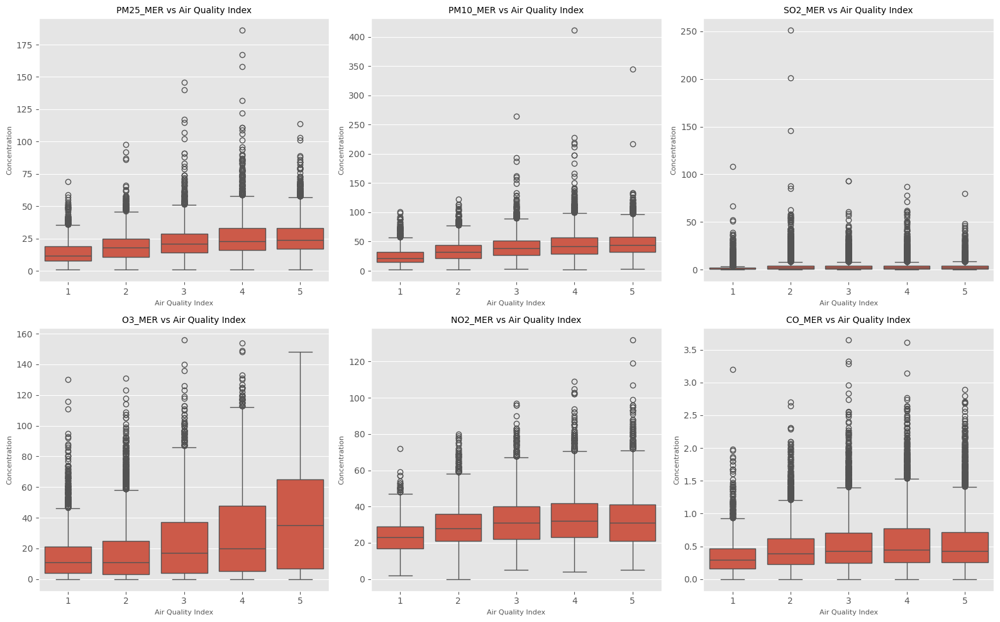

In [ ]:
plt.figure(figsize=(16, 10))

# Create box plots for each pollutant against AirQualityIndex
for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(2, 3, i)  # Arrange plots in a 2x3 grid
    sns.boxplot(
        x='AirQualityIndex',
        y=pollutant,
        data=df
    )
    plt.title(f'{pollutant} vs Air Quality Index', fontsize=10)
    plt.xlabel('Air Quality Index', fontsize=8)
    plt.ylabel('Concentration', fontsize=8)

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

**5. Air Quality Analysis**

| **Pollutant** | **Observations** | **Interpretation** |
|--------------|----------------|------------------|
| **PM2.5** | PM2.5 increases with AQI, median values rise with AQI levels, extreme outliers >150 µg/m³ | PM2.5 is a major contributor to poor air quality, linked to combustion and vehicular emissions |
| **PM10** | PM10 rises with AQI, wider distribution at higher AQI levels, some values >300 µg/m³ | PM10 impacts air quality, influenced by dust storms, construction, and industry |
| **SO₂** | SO₂ median increases slightly, narrow spread, rare high values >100 µg/m³ | SO₂ contributes to AQI but less than particulates; linked to sulfur combustion |
| **O₃** | O₃ range widens at high AQI, median gradually increases, outliers >140 µg/m³ | O₃ forms from NOₓ & VOCs in sunlight, more relevant in warm months |
| **NO₂** | NO₂ shows a clear upward trend with AQI, high values >120 µg/m³ at AQI 4-5 | NO₂ is a key urban pollutant from traffic and industry, strongly correlated with AQI |
| **CO** | CO median rises gradually, wider spread at high AQI, outliers >3 µg/m³ | CO comes from incomplete combustion, mainly vehicular emissions and biomass burning |

---
**General Insights**
- **Strong Correlation with Particulates**:  
   - PM2.5 and PM10 are the dominant contributors to poor air quality, as evidenced by their strong association with higher AQI levels.  
   - These pollutants are particularly harmful due to their ability to penetrate deep into the lungs.

- **Seasonal and Meteorological Influence**:  
   - The patterns suggest that factors like weather, industrial activities, and traffic significantly influence pollutant concentrations.  
   - For instance, O₃ levels are typically higher in warmer months due to photochemical reactions.

- **Outliers and Pollution Events**:  
   - The presence of outliers across pollutants indicates episodic pollution events, such as industrial malfunctions, wildfires, or festivals.


**6. Correlation Matrix**

In [21]:
features = df.select_dtypes(include=np.number).columns

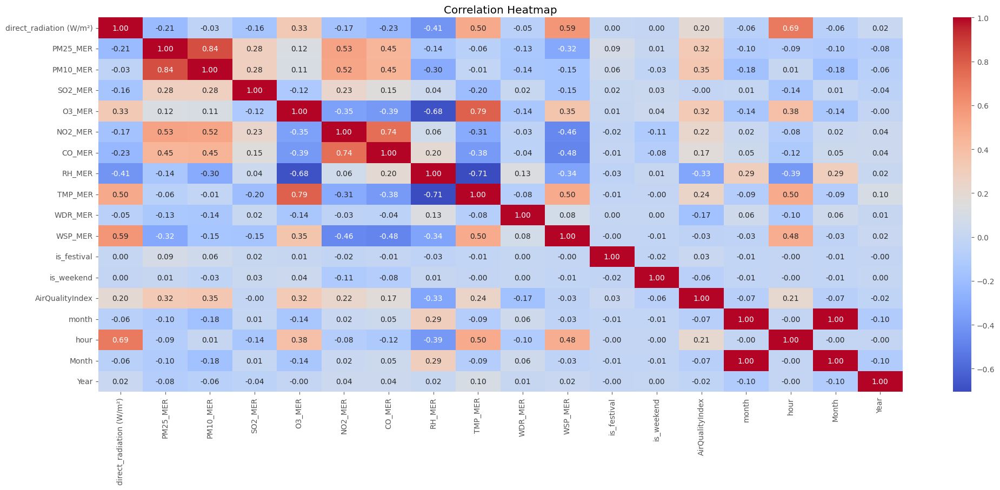

In [22]:
# Correlation Heatmap
plt.figure(figsize=(24, 9))
sns.heatmap(df[features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()



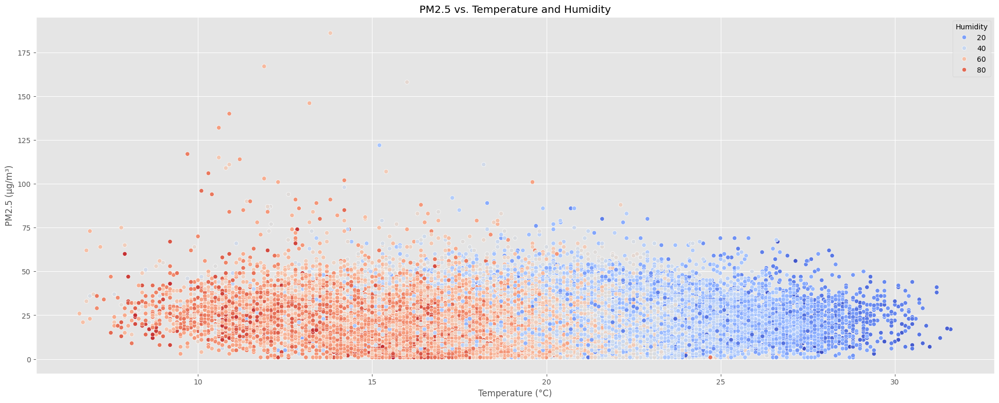

In [23]:
# PM2.5 vs. Other Variables (Temperature and Humidity)
plt.figure(figsize=(24, 9))
sns.scatterplot(x=df['TMP_MER'], y=df['PM25_MER'],hue=df['RH_MER'], sizes=(20, 200), palette='coolwarm')
plt.title('PM2.5 vs. Temperature and Humidity')
plt.xlabel('Temperature (°C)')
plt.ylabel('PM2.5 (µg/m³)')
plt.legend(title='Humidity')
plt.show()

**Observations & Insights on Temperature, Humidity, and PM2.5 Levels**

<br>

- **Observations**

| **Aspect** | **Key Observations** |
|------------|----------------------------------------------------|
| **🌡 Temperature vs. PM2.5 Levels** | - Higher temperatures are generally associated with lower PM2.5 concentrations, though variability exists. <br> - At **lower temperatures (<15°C)**, PM2.5 levels fluctuate more, with some significantly high values. |
| **💧 Humidity Influence** | - **Low humidity (blue points)** is more common at higher temperatures, where PM2.5 levels tend to be lower. <br> - **High humidity (red points)** is dominant at lower temperatures and often correlates with increased PM2.5 levels. |
| **📈 High PM2.5 Outliers** | - Some extreme **PM2.5 levels (>125 µg/m³)** occur mostly at **low temperatures and high humidity**. |

---

- **Insights**

| **Key Insight** | **Explanation** |
|----------------|---------------------------------------------------|
| **Humidity and PM2.5 Correlation** | Higher humidity levels tend to correspond with increased PM2.5 concentrations, particularly in colder conditions. |
| **Temperature Impact on Air Quality** | Rising temperatures **reduce humidity** and help stabilize PM2.5 levels at lower concentrations. |
| **Cold & Humid Conditions Worsen Air Quality** | The combination of **cold temperatures** and **high humidity** is associated with **higher PM2.5 levels**, indicating poor air quality risks. |

---

- **Conclusion**

This analysis suggests that **environmental conditions (temperature and humidity) significantly influence PM2.5 concentrations**. Monitoring these factors could help **predict air quality fluctuations** and identify conditions **prone to pollution spikes**.


## **Time Series Analysis**

**1. Analyze factors**

In [24]:
def calculate_correlations(variables):
    corr_matrix = df[variables].corr()
    return corr_matrix
calculate_correlations(df.select_dtypes(include=np.number).columns).head(5)

,direct_radiation (W/m²),PM25_MER,PM10_MER,SO2_MER,O3_MER,NO2_MER,CO_MER,RH_MER,TMP_MER,WDR_MER,WSP_MER,is_festival,is_weekend,AirQualityIndex,month,hour,Month,Year
direct_radiation (W/m²),1.000000,-0.213236,-0.032417,-0.156977,0.328124,-0.170886,-0.227457,-0.408319,0.500437,-0.054453,0.592328,0.004368,0.000250,0.196357,-0.061212,0.694154,-0.061212,0.022139
PM25_MER,-0.213236,1.000000,0.844049,0.281324,0.124585,0.528116,0.445188,-0.138894,-0.060039,-0.130479,-0.315345,0.090796,0.007397,0.323966,-0.101830,-0.085628,-0.101830,-0.081414
PM10_MER,-0.032417,0.844049,1.000000,0.280859,0.111093,0.522798,0.447723,-0.299566,-0.012220,-0.139613,-0.152641,0.055821,-0.025079,0.346763,-0.175019,0.010077,-0.175019,-0.060641
SO2_MER,-0.156977,0.281324,0.280859,1.000000,-0.123645,0.231923,0.154647,0.038993,-0.204879,0.019106,-0.154569,0.016115,0.027317,-0.000045,0.005837,-0.139155,0.005837,-0.041870
O3_MER,0.328124,0.124585,0.111093,-0.123645,1.000000,-0.354604,-0.388081,-0.684887,0.786092,-0.143768,0.354270,0.012080,0.036606,0.321951,-0.139593,0.381273,-0.139593,-0.000456


In [25]:
def analyze_temporal_patterns():
    hourly_aqi = df.groupby('hour')['AirQualityIndex'].mean()
    seasonal_aqi = df.groupby('Month')['AirQualityIndex'].mean()
    weekend_effect = df.groupby('is_weekend')['AirQualityIndex'].mean()
    festival_effect = df.groupby('is_festival')['AirQualityIndex'].mean()
    return hourly_aqi, seasonal_aqi, weekend_effect, festival_effect


hourly_aqi, monthly_aqi, weekend_effect, festival_effect = analyze_temporal_patterns()


In [26]:
festival_effect

,AirQualityIndex
is_festival,
0,3.148652
1,3.314264


In [27]:
weekend_effect

,AirQualityIndex
is_weekend,
0,3.206798
1,3.031962


In [28]:
monthly_aqi

,AirQualityIndex
Month,
1,3.575744
2,3.514403
3,3.396057
4,3.414794
5,3.162634
6,2.593056
7,2.915751
8,2.879032
9,2.497222


In [29]:
hourly_aqi

,AirQualityIndex
hour,
0,2.544643
1,2.456989
2,2.534050
3,2.549283
4,2.755376
5,2.922043
6,2.899642
7,2.876344
8,2.905914


In [30]:
new_poll =['PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER', 'AirQualityIndex']
pollutant_dropdown = widgets.Dropdown(
    options=new_poll,
    value='AirQualityIndex',
    description='Pollutant:',
    style={'description_width': 'initial'}
)

def create_figure(selected_pollutant):
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            f'Hourly {selected_pollutant} Patterns',
            f'Monthly {selected_pollutant} Patterns',
            'Weekend Effect',
            'Festival Effect'
        )
    )

    # Hourly patterns
    hourly_data = df.groupby('hour')[selected_pollutant].mean()
    fig.add_trace(
        go.Scatter(
            x=hourly_data.index,
            y=hourly_data.values,
            mode='lines+markers',
            name=f'Hourly {selected_pollutant}'
        ),
        row=1, col=1
    )

    # Monthly patterns
    monthly_data = df.groupby('Month')[selected_pollutant].mean()
    fig.add_trace(
        go.Bar(
            x=['Winter', 'Spring', 'Summer', 'Fall'],
            y=monthly_data.values,
            name=f'Monthly {selected_pollutant}'
        ),
        row=1, col=2
    )

    # Weekend effect
    weekend_data = df.groupby('is_weekend')[selected_pollutant].mean()
    fig.add_trace(
        go.Bar(
            x=['Weekday', 'Weekend'],
            y=weekend_data.values,
            name=f'Weekend {selected_pollutant}'
        ),
        row=2, col=1
    )

    # Festival effect
    festival_data = df.groupby('is_festival')[selected_pollutant].mean()
    fig.add_trace(
        go.Bar(
            x=['Non-Festival', 'Festival'],
            y=festival_data.values,
            name=f'Festival {selected_pollutant}'
        ),
        row=2, col=2
    )

    fig.update_layout(
        height=800,
        width=1200,
        showlegend=False,
        title_text=f"Temporal Patterns in {selected_pollutant}"
    )
    return fig

# Function to update the plot
def update_plot(change):
    selected_pollutant = change['new']
    fig = create_figure(selected_pollutant)
    fig.show()

# Attach the update function
pollutant_dropdown.observe(update_plot, names='value')

# Display the widget
display(pollutant_dropdown)

# Initial plot display
initial_fig = create_figure(pollutant_dropdown.value)
initial_fig.show()

Dropdown(description='Pollutant:', index=6, options=('PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', '…

**2. Analyze AQI (By Season, Temporal Patterns)**

*Overall Trends in AQI*

In [56]:
df.reset_index(inplace=True)  # Ensure datetime is not already the index
df['datetime'] = pd.to_datetime(df['datetime'])
df.set_index('datetime', inplace=True)

# Resample data for daily and monthly averages
daily_data = df.resample('D').mean()
monthly_data = df.resample('ME').mean()

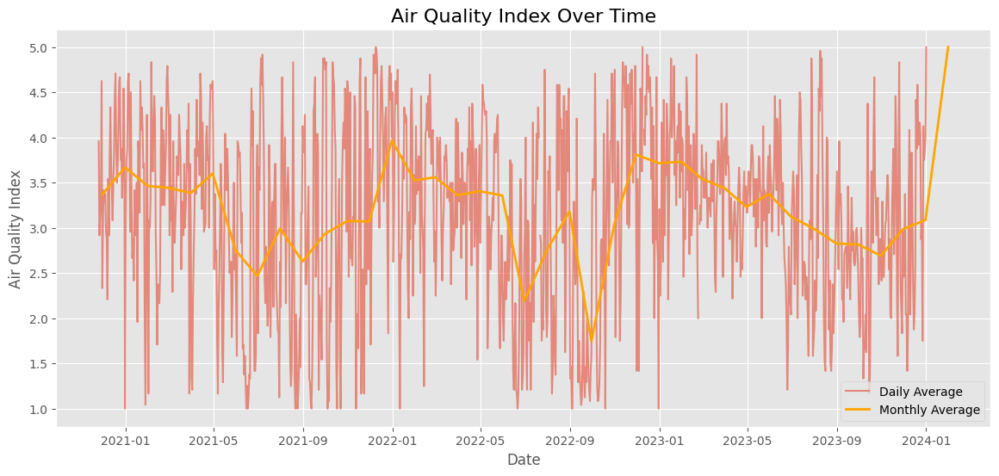

In [57]:
plt.figure(figsize=(14, 6))
plt.plot(daily_data.index, daily_data['AirQualityIndex'], label='Daily Average', alpha=0.6)
plt.plot(monthly_data.index, monthly_data['AirQualityIndex'], label='Monthly Average', linewidth=2, color='orange')
plt.title('Air Quality Index Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Air Quality Index', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

**Explanation**

Weather conditions like low temperature, calm wind and high humidity in winter is resulting a high AQI. Human activities like increased heating and traffic combustion also add to it.

In Summer high temperature, stronger wind helps disperse pollutants and reduces their concentration at ground level.

*Smoothed AQI with rolling average*

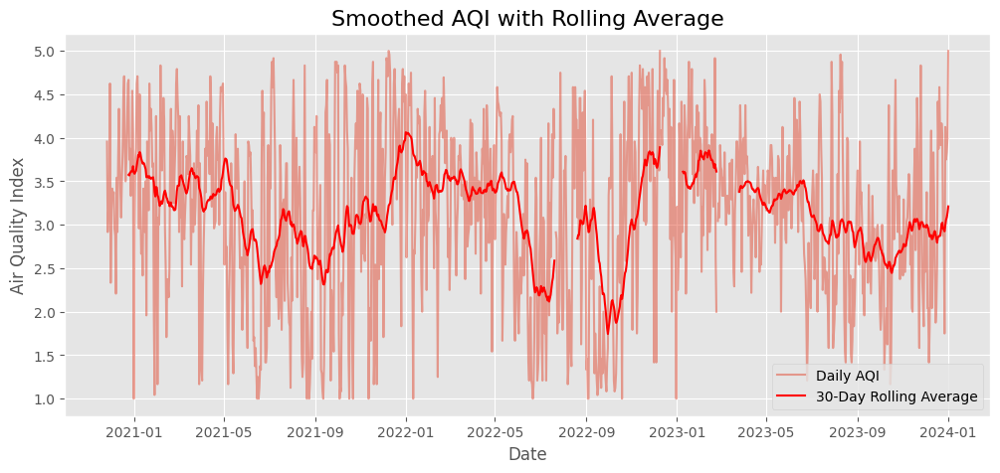

In [66]:
rolling_avg = daily_data['AirQualityIndex'].rolling(window=30).mean()

plt.figure(figsize=(12, 5))
plt.plot(daily_data.index, daily_data['AirQualityIndex'], label='Daily AQI', alpha=0.5)
plt.plot(daily_data.index, rolling_avg, label='30-Day Rolling Average', color='red')
plt.title('Smoothed AQI with Rolling Average', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Air Quality Index', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

*365 day rolling average of AQI*

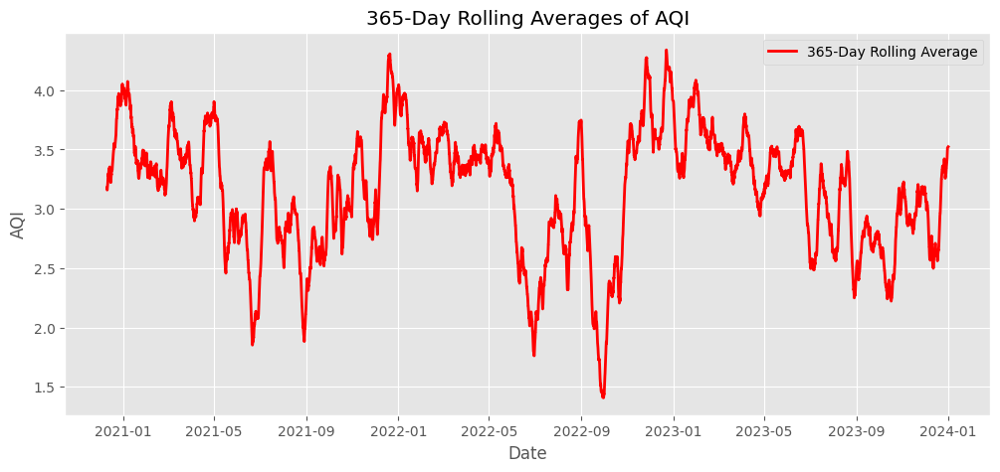

In [65]:
df['365_day_avg'] = df['AirQualityIndex'].rolling(window=365).mean()

# Plot the trends
plt.figure(figsize=(12, 5))
plt.plot(df.index, df['365_day_avg'], label='365-Day Rolling Average', color='red', linewidth=2)
plt.title('365-Day Rolling Averages of AQI')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

*Decompose Time Series plot*

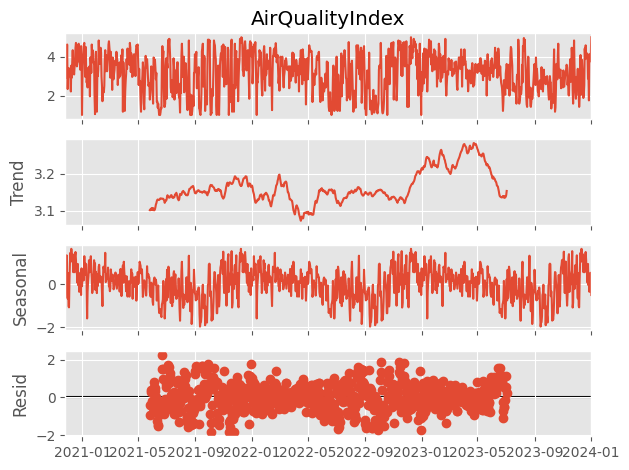

In [61]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Decompose the time series into trend, seasonality, and residuals
decomposition = seasonal_decompose(daily_data['AirQualityIndex'].dropna(), model='additive', period=365)

# Plot the decomposed components
decomposition.plot()
plt.show()

*Effect of Weather on AQI*

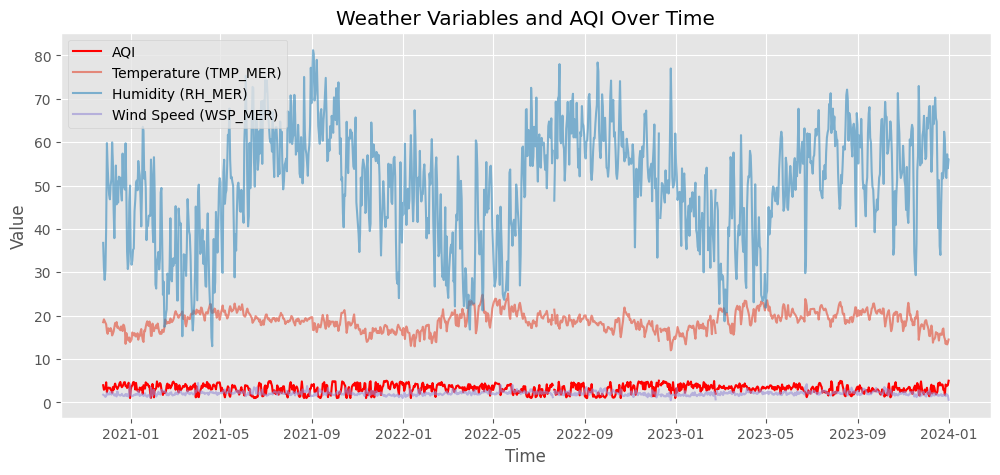

In [64]:
plt.figure(figsize=(12, 5))
plt.plot(daily_data.index, daily_data['AirQualityIndex'], label='AQI', color='red')
plt.plot(daily_data.index, daily_data['TMP_MER'], label='Temperature (TMP_MER)', alpha=0.6)
plt.plot(daily_data.index, daily_data['RH_MER'], label='Humidity (RH_MER)', alpha=0.6)
plt.plot(daily_data.index, daily_data['WSP_MER'], label='Wind Speed (WSP_MER)', alpha=0.6)
plt.legend()
plt.title('Weather Variables and AQI Over Time')
plt.xlabel('Time')
plt.ylabel('Value')
plt.grid(True)
plt.show()



Summer (Rank 1):
- Average AQI: 2.80
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 16.80
  * PM10: 28.49
  * O3: 24.69
  * NO2: 25.92


Fall (Rank 2):
- Average AQI: 2.92
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 19.07
  * PM10: 32.60
  * O3: 20.91
  * NO2: 29.57


Spring (Rank 3):
- Average AQI: 3.32
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 25.53
  * PM10: 46.40
  * O3: 35.36
  * NO2: 30.38


Winter (Rank 4):
- Average AQI: 3.57
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 26.15
  * PM10: 48.61
  * O3: 21.81
  * NO2: 36.23



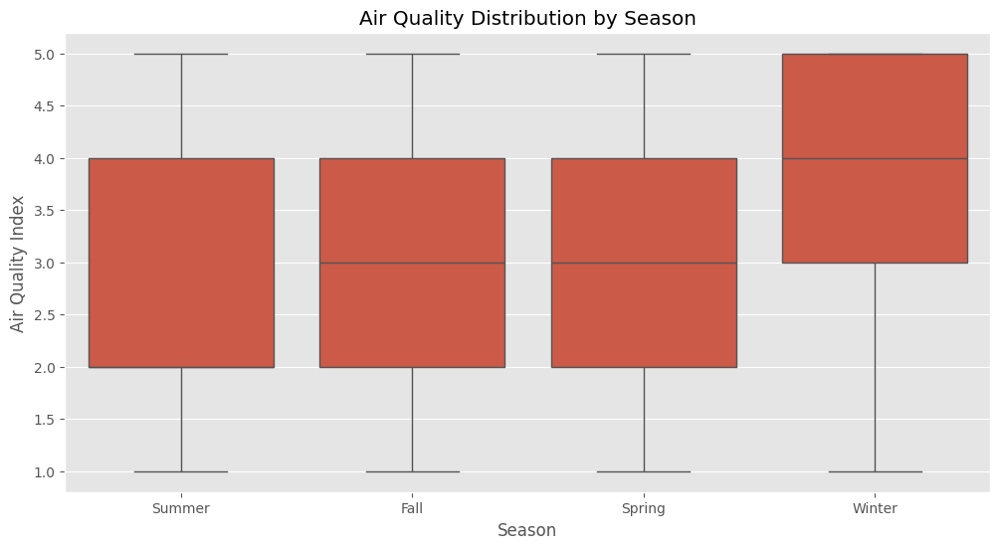

In [31]:
def analyze_seasonal_air_quality(df):
    """
    Analyze and rank air quality across seasons
    """
    # Create season mapping
    season_mapping = {12: 'Winter', 1: 'Winter', 2: 'Winter',
                     3: 'Spring', 4: 'Spring', 5: 'Spring',
                     6: 'Summer', 7: 'Summer', 8: 'Summer',
                     9: 'Fall', 10: 'Fall', 11: 'Fall'}

    # Add season column
    df['season'] = pd.to_datetime(df['datetime']).dt.month.map(season_mapping)

    # Calculate seasonal metrics
    seasonal_metrics = pd.DataFrame()

    # Calculate various air quality metrics by season
    seasonal_metrics = df.groupby('season').agg({
        'AirQualityIndex': ['mean', 'median', 'std', 'min', 'max'],
        'PM25_MER': 'mean',
        'PM10_MER': 'mean',
        'SO2_MER': 'mean',
        'O3_MER': 'mean',
        'NO2_MER': 'mean',
        'CO_MER': 'mean'
    }).round(2)

    # Flatten column names
    seasonal_metrics.columns = ['_'.join(col).strip() for col in seasonal_metrics.columns.values]

    # Calculate overall rank (based on mean AQI, lower is better)
    seasonal_metrics['overall_rank'] = seasonal_metrics['AirQualityIndex_mean'].rank()

    # Sort by mean AQI
    seasonal_metrics = seasonal_metrics.sort_values('AirQualityIndex_mean')

    return seasonal_metrics

def create_seasonal_visualizations(df, seasonal_metrics):
    """
    Create visualizations for seasonal air quality analysis
    """
    # 1. Season Ranking Box Plot
    fig1 = plt.figure(figsize=(12, 6))
    sns.boxplot(x='season', y='AirQualityIndex', data=df,
                order=seasonal_metrics.index)
    plt.title('Air Quality Distribution by Season')
    plt.xlabel('Season')
    plt.ylabel('Air Quality Index')

    # 2. Create detailed pollutant comparison
    fig2 = make_subplots(rows=2, cols=1,
                        subplot_titles=('Average AQI by Season',
                                      'Pollutant Levels by Season'))

    # Add AQI bar chart
    fig2.add_trace(
        go.Bar(x=seasonal_metrics.index,
               y=seasonal_metrics['AirQualityIndex_mean'],
               name='Average AQI',
               text=seasonal_metrics['overall_rank'].astype(int).astype(str),
               textposition='outside'),
        row=1, col=1
    )

    # Add pollutant lines
    pollutants = ['PM25_MER', 'PM10_MER', 'SO2_MER',
                  'O3_MER', 'NO2_MER', 'CO_MER']

    for pollutant in pollutants:
        fig2.add_trace(
            go.Scatter(x=seasonal_metrics.index,
                      y=seasonal_metrics[f'{pollutant}_mean'],
                      name=pollutant,
                      mode='lines+markers'),
            row=2, col=1
        )

    fig2.update_layout(height=800, width=1000,
                      title_text="Seasonal Air Quality Analysis",
                      showlegend=True)

    return fig1, fig2

def generate_seasonal_summary(seasonal_metrics):
    """
    Generate a detailed summary of seasonal air quality rankings
    """
    # Sort by AQI mean for ranking
    ranked_seasons = seasonal_metrics.sort_values('AirQualityIndex_mean')

    summary = []
    for season in ranked_seasons.index:
        metrics = ranked_seasons.loc[season]
        summary.append(f"""
{season} (Rank {int(metrics['overall_rank'])}):
- Average AQI: {metrics['AirQualityIndex_mean']:.2f}
- AQI Range: {metrics['AirQualityIndex_min']:.2f} - {metrics['AirQualityIndex_max']:.2f}
- Primary Pollutants:
  * PM2.5: {metrics['PM25_MER_mean']:.2f}
  * PM10: {metrics['PM10_MER_mean']:.2f}
  * O3: {metrics['O3_MER_mean']:.2f}
  * NO2: {metrics['NO2_MER_mean']:.2f}
""")

    return '\n'.join(summary)

seasonal_metrics = analyze_seasonal_air_quality(df)
fig1, fig2 = create_seasonal_visualizations(df, seasonal_metrics)
summary = generate_seasonal_summary(seasonal_metrics)
fig1.show()
fig2.show()
print(summary)

In [32]:
# Function to create temporal patterns plot
def create_temporal_patterns_plot(df):
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Hourly AQI Patterns',
                        'Monthly AQI Patterns',
                        'Weekend Effect',
                        'Festival Effect')
    )

    hourly_aqi = df.groupby('hour')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Scatter(x=hourly_aqi.index,
                   y=hourly_aqi.values,
                   mode='lines+markers'),
        row=1, col=1
    )

    seasonal_aqi = df.groupby('Month')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Bar(x=['Summer', 'Fall', 'Winter', 'Spring', ],
               y=seasonal_aqi.values),
        row=1, col=2
    )

    weekend_aqi = df.groupby('is_weekend')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Bar(x=['Weekday', 'Weekend'],
               y=weekend_aqi.values),
        row=2, col=1
    )

    festival_aqi = df.groupby('is_festival')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Bar(x=['Non-Festival', 'Festival'],
               y=festival_aqi.values),
        row=2, col=2
    )

    fig.update_layout(height=800,
                      width=1200,
                      showlegend=False,
                      title_text="Temporal Patterns in Air Quality")
    return fig

# Function to create pollutant relationships plot
def create_pollutant_relationships_plot(df):
    fig = px.scatter_matrix(
        df,
        dimensions=['PM25_MER', 'PM10_MER', 'SO2_MER',
                    'O3_MER', 'NO2_MER', 'CO_MER'],
        color='AirQualityIndex',
        title="Relationships Between Different Pollutants"
    )
    fig.update_layout(height=1000, width=1000)
    return fig



In [33]:
create_temporal_patterns_plot(df)

In [34]:
create_pollutant_relationships_plot(df)

**General Overview & Key Observations**

- **General Overview**
  - The plot showcases **pairwise relationships** between various air pollutants:
    - **PM2.5_MER**, **PM10_MER**, **SO2_MER**, **O3_MER**, **NO2_MER**, and **CO_MER**.
  - **Air Quality Index (AQI)** is represented as a **color gradient** in the scatterplots:
    - 🟡 **Yellow** → Higher AQI (**poorer air quality**).
    - 🟣 **Purple** → Lower AQI (**better air quality**).

---

-  **Key Observations**

| **Observation** | **Details** |
|---------------|--------------------------------------------------------------|
| **📈 Positive Correlations Between Pollutants** | - Strong relationship between **PM2.5_MER** and **PM10_MER**. <br> - **NO2_MER** and **PM2.5_MER** are linked, likely due to **vehicular emissions** and **industrial activities**. <br> - These pollutants often originate from **common sources** or are affected by **similar atmospheric conditions**. |
| **📉 Weak or Non-Linear Relationships** | - **CO_MER** and **O3_MER**, or **SO2_MER** and **CO_MER**, show **weak correlations**. <br> - This suggests that they **originate from different sources** or undergo **different atmospheric processes**. |
| **🌫 Air Quality Index (Color Gradient)** | - High AQI (🟡 **yellow clusters**) appear where **PM2.5_MER, PM10_MER, and NO2_MER** are high. <br> - Confirms that **particulate matter (PM2.5, PM10) and NO2** play a **major role** in air pollution. |

---

- **Potential Interpretations**

| **Interpretation** | **Explanation** |
|------------------|------------------------------------------------------|
| **🚗 Pollutants with Common Sources** | - **PM2.5_MER, PM10_MER, and NO2_MER** likely come from: <br> ✅ Vehicular emissions <br> ✅ Industrial activities <br> ✅ Fossil fuel combustion |
| **☀ Secondary Pollutants** | - **O3_MER (ozone)** has weaker correlations with other pollutants. <br> - This is because **ozone forms from NOx and VOCs in sunlight**, rather than being emitted directly. |
| **📍 Localized vs. Regional Pollutants** | - **CO_MER (carbon monoxide)** is **more localized**, likely from **traffic hotspots**. <br> - **PM2.5_MER and PM10_MER** are **regional pollutants**, traveling longer distances and showing **wider correlations**. |
| **📊 Impact on Air Quality Index (AQI)** | - **PM2.5_MER, PM10_MER, and NO2_MER** are the **primary contributors to poor air quality**. <br> - **Policies targeting these pollutants** can significantly **improve air quality**. |

---

- **Conclusion**

This analysis highlights how **common pollutant sources, atmospheric processes, and secondary formations** influence **air quality deterioration**. Controlling **PM2.5, PM10, and NO2** levels can **reduce AQI** and **improve environmental conditions**. 🚀


**3. Pollutant Levels (Hourly, Monthly)**

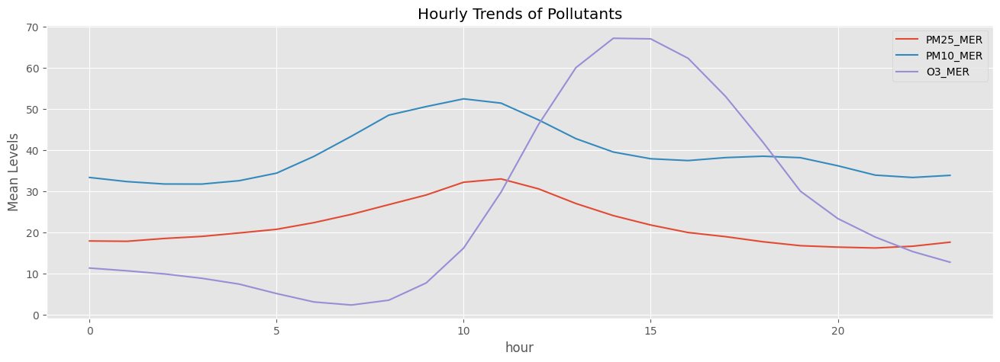

In [40]:
focused_columns = ['PM25_MER', 'PM10_MER', 'O3_MER']
df = df[focused_columns + ['hour', 'Month', 'is_weekend', 'is_festival']]

hourly_means = df.groupby('hour')[focused_columns].mean()
hourly_means.plot(kind='line', figsize=(16, 5))
plt.title('Hourly Trends of Pollutants')
plt.ylabel('Mean Levels')
plt.show()

**Observations & Insights on Air Pollutants Over Time**

- **Observations**

| **Pollutant** | **Key Trends** |
|--------------|----------------------------------------------------------|
| **🟠 PM10 (Orange Line)** | - **Dominant Contributor**: Highest concentrations throughout the day. <br> - **Peak Hours**: Rises after midnight, peaking between **10:00 AM – 2:00 PM**. <br> - **Decline**: Gradual decrease in the evening. |
| **🔵 PM2.5 (Blue Line)** | - **Steady Increase**: Starts rising around **2:00 AM**, peaking slightly after **12:00 PM**. <br> - **Lower Concentration**: Follows a similar trend to PM10 but at lower levels. |
| **🟢 Ozone (O3) (Green Line)** | - **Distinct Peak**: Sharp rise around **11:00 AM**, peaking between **12:00 – 1:00 PM**. <br> - **Rapid Decline**: Drops significantly in the afternoon and remains low at night. |

---

- **Insights**

| **Insight** | **Explanation** |
|------------|--------------------------------------------------------------|
| **⏳ Temporal Peaks** | - **PM10 & PM2.5** increase due to **morning traffic and industrial emissions**. <br> - **O3** peaks later in the morning due to **photochemical reactions** driven by sunlight. |
| **🏭 Potential Sources** | - **PM10 & PM2.5**: Likely from **traffic, industrial emissions, and construction dust**. <br> - **Ozone (O3)**: Forms from **sunlight interacting with NOx and VOCs**. |
| **🕰 Actionable Hours** | - **Lower pollution levels before 10:00 AM and after 6:00 PM**. <br> - **Safer periods for outdoor activities** due to reduced pollutant exposure. |

---

- **Conclusion**

This analysis highlights **PM10 as the dominant pollutant**, with **Ozone following a distinct daily cycle** influenced by sunlight. Understanding these patterns can help in **planning outdoor activities and reducing exposure to air pollution**. 🚀


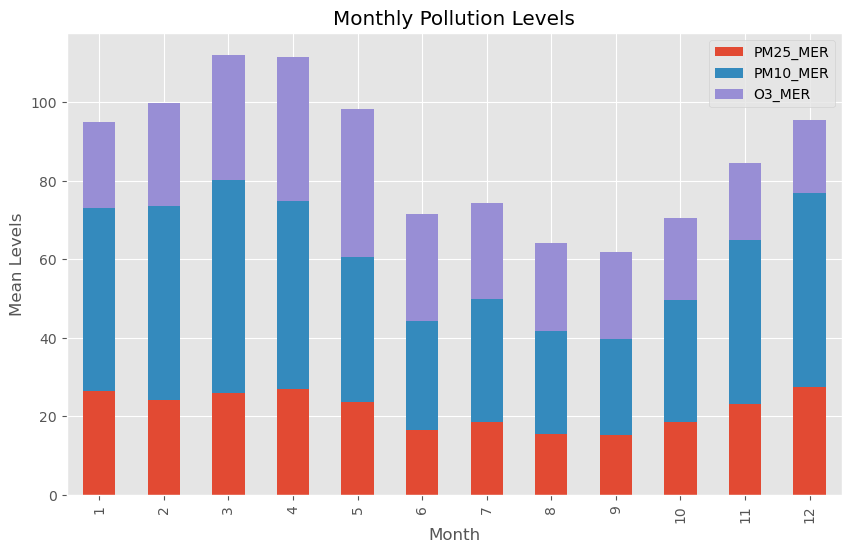

In [ ]:
monthly_means = df.groupby('Month')[focused_columns].mean()
monthly_means.plot(kind='bar', figsize=(10, 6), stacked=True)
plt.title('Monthly Pollution Levels')
plt.ylabel('Mean Levels')
plt.xlabel('Month')
plt.show()

 **Monthly Pollution Levels for PM2.5, PM10, and Ozone (O3)**

- **Objective**

The stacked bar chart presents the **monthly mean pollution levels** of **PM2.5**, **PM10**, and **O3**, enabling a **comparative assessment** of **seasonal variations** and the contribution of each pollutant throughout the year.

---

- **Observations**

| **Observation** | **Key Details** |
|---------------|----------------------------------------------------------|
| **📈 Overall Trend** | - Pollution levels are **higher from January to May** compared to June–November. <br> - **December** shows another increase, reaching levels close to peak months. |
| **🟠 PM10 (Orange Bar)** | - **Dominant pollutant** across all months, forming the **largest segment** in each bar. <br> - **Highest levels in March–May**, possibly due to **increased dust & human activity**. |
| **🔵 PM2.5 (Blue Bar)** | - **Steady contribution** throughout the year, without drastic fluctuations. <br> - **Slight increase in March–May & December**, aligning with **seasonal pollution surges**. |
| **🟢 Ozone (O3) (Green Bar)** | - **Seasonal Dependence**: O3 levels peak in **March–May** (especially **April**), likely due to **increased sunlight & photochemical reactions**. <br> - **Lower levels in June–November**, consistent with **reduced solar intensity**. |

---

- **Insights**

| **Insight** | **Explanation** |
|------------|------------------------------------------------------|
| **🌞 Seasonal Peaks** | - **March–May**: The **highest pollution period**, possibly due to **dry weather, dust, & photochemical activities**. <br> - **December**: A **second peak**, likely due to **wintertime inversion effects**. |
| **🏭 Dominant Pollutants** | - **PM10** is the **primary pollutant year-round**, requiring strategies to **reduce sources like construction & industrial dust**. <br> - **Ozone (O3)** peaks **seasonally**, emphasizing the need to **control precursors (NOx & VOCs) in warmer months**. |

---

- **Conclusion**

The analysis highlights **seasonal variations** in pollution levels, with **PM10 dominating** and **Ozone peaking in warm months**. Understanding these patterns can help in **implementing effective pollution control strategies** throughout the year. 🚀


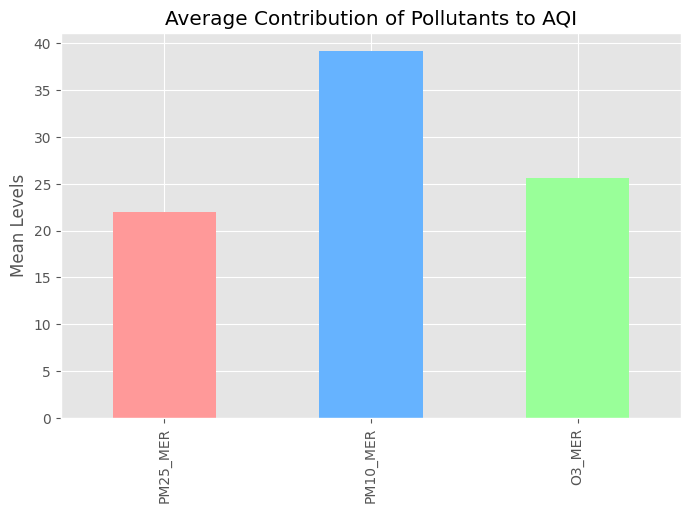

In [41]:
mean_contributions = df[focused_columns].mean()
mean_contributions.plot(kind='bar', figsize=(8, 5), color=['#FF9999', '#66B3FF', '#99FF99'])
plt.title('Average Contribution of Pollutants to AQI')
plt.ylabel('Mean Levels')
plt.show()

**Analysis Summary**

- **Trends in Air Pollutants**

| **Pollutant** | **Trend & Key Observations** |
|--------------|--------------------------------------------------------------|
| **🟠 PM2.5 & PM10** | - Significant **seasonal variation**, with **higher levels in winter (Dec–Feb)**. <br> - **PM2.5 peaked at 32.23 µg/m³ (Nov 2020)**, dropping to **12.18 µg/m³ (Sep 2022)**. <br> - **PM10 follows a similar trend**, driven by **heating activities & poor air dispersion**. |
| **🟡 SO₂ (Sulfur Dioxide)** | - **Consistently low levels**, with occasional spikes. |
| **🟢 O₃ (Ozone)** | - **Stable overall**, but **slight increases in warmer months** due to photochemical reactions. |
| **🔴 NO₂ (Nitrogen Dioxide)** | - **Higher concentrations in winter**, likely due to **urban emissions & heating sources**. |
| **⚫ CO (Carbon Monoxide)** | - **Generally low**, but **peaks during festivals**, possibly from **combustion-related activities**. |

---

- **Meteorological Patterns**

| **Weather Factor** | **Impact on Air Quality** |
|------------------|----------------------------------------------------------|
| **🌡 Temperature** | - **Higher temperatures (22.32°C in May 2022)** improve air quality by aiding pollutant dispersion. <br> - **Lower temperatures (15.80°C in Jan 2022)** correlate with **higher pollution levels**. |
| **💧 Humidity** | - **High humidity in colder months** worsens **PM2.5 levels**. <br> - **Lower humidity in warmer months** helps **reduce PM2.5 concentration**. |
| **🌬 Wind** | - **Stronger winds in summer** improve air quality by **dispersing pollutants**. |

---

- **Key Relationships with AQI**

| **Pollutant** | **Relationship with AQI** |
|--------------|---------------------------------------------------------------|
| **PM2.5 & PM10** | - **Strong contributors to higher AQI levels**. <br> - **Increased concentrations observed during air pollution spikes** from **industrial & natural events**. |
| **SO₂** | - **Minor impact** on air quality, maintaining **low median values across AQI levels**. |
| **O₃** | - **Higher levels in warmer months & high AQI levels**, linked to **sunlight-driven photochemical reactions**. |
| **NO₂** | - **Substantial contributor to AQI**, strongly associated with **urban emissions from traffic & industries**. |
| **CO** | - **Gradual increase with worsening AQI**, but impact is **less pronounced compared to particulates**. |

---

- **Impact of Festivals and Special Events**
- **Pollutant levels (PM2.5, CO) increase slightly** during **festival seasons**, suggesting heightened **human activities** such as:
  - 🚗 **Increased transportation**
  - 🔥 **Combustion from celebrations & industrial activities**

---

- **Correlations and Influences**

| **Factor** | **Impact** |
|-----------|--------------------------------------------------------------|
| **📈 Positive Correlations** | - **PM2.5 & PM10** show **strong interrelationships**. <br> - **PM2.5 & NO₂** are closely linked, reflecting **common sources like vehicular emissions**. |
| **🌡 Environmental Conditions** | - **Cold temperatures & high humidity worsen PM2.5 levels**. <br> - Indicates **weather plays a critical role** in **air quality fluctuations**. |

---

- **Conclusion**

This analysis highlights **seasonal variations in air pollution**, emphasizing the **dominant role of PM2.5, PM10, and NO₂** in driving **poor air quality**. Environmental factors like **temperature, humidity, and wind speed** significantly **influence pollution levels**, which can help shape **targeted mitigation strategies**. 🚀


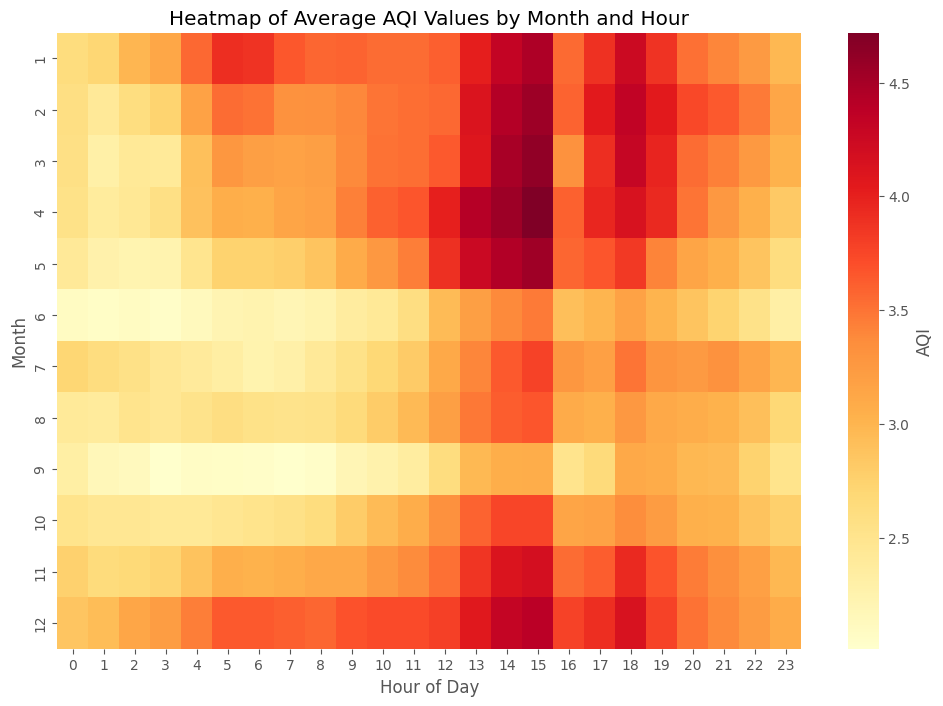

In [49]:
# Convert datetime column to datetime type
df['datetime'] = pd.to_datetime(df['datetime'])

# Set datetime as index
df.set_index('datetime', inplace=True)

df['month'] = df.index.month
df['hour'] = df.index.hour

monthly_hourly_aqi = df.groupby(['month', 'hour'])['AirQualityIndex'].mean().unstack()

plt.figure(figsize=(12, 8))
sns.heatmap(monthly_hourly_aqi, cmap='YlOrRd', cbar_kws={'label': 'AQI'})
plt.title('Heatmap of Average AQI Values by Month and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.show()

**Explanation**

The heatmap reveals that the highest AQI values are observed during the winter months, likely due to factors like increased residential heating, reduced ventilation, and increased emissions from certain industries. Specifically, months 12, 1, and 2 show the most intense red colors, indicating the highest average AQI readings.

In terms of diurnal patterns, the heatmap suggests that air pollution peaks during late morning and early afternoon hours, between approximately 10 AM to 4 PM. This could be attributed to increased traffic congestion, industrial activity, and higher temperatures leading to increased ground-level ozone formation.

## **Outlier Analysis**

In [45]:
# Load the dataset
import pandas as pd

# df = pd.read_csv(r"C:\Users\Ellen\Desktop\Air\mer_imputed_merged_data.xlsx - Sheet1.csv")
df=pd.read_csv('/content/sample_data/mer_imputed_merged_data.csv')

In [46]:
# Display column names
print(df.columns)

Index(['datetime', 'direct_radiation (W/m²)', 'PM25_MER', 'PM10_MER',
       'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER', 'RH_MER', 'TMP_MER',
       'WDR_MER', 'WSP_MER', 'is_festival', 'is_weekend', 'AirQualityIndex'],
      dtype='object')


In [47]:
# Adjust column list to match the dataset
pollutants_weather = [
    'O3_MER', 'PM25_MER', 'PM10_MER', 'TMP_MER', 'RH_MER',
    'WSP_MER', 'AirQualityIndex', 'datetime'
]

# Focus on relevant columns
df_focus = df[pollutants_weather]

# Check for missing values
print(df_focus.isnull().sum())

# Handle missing values (drop rows with missing data)
df_focus = df_focus.dropna()

# Convert 'datetime' to DateTime format for temporal analysis
df_focus['datetime'] = pd.to_datetime(df_focus['datetime'])

O3_MER             0
PM25_MER           0
PM10_MER           0
TMP_MER            0
RH_MER             0
WSP_MER            0
AirQualityIndex    0
datetime           0
dtype: int64


**1. Detect Outliers**

In [48]:
# Analyze Outliers for Each Pollutant: Store and summarize the outliers for later analysis.
outliers_summary = {}
for pollutant in pollutants:
    outliers = detect_outliers(df, pollutant)
    outliers_summary[pollutant] = len(outliers)
    print(f'{pollutant}: {len(outliers)} outliers detected')

NameError: name 'detect_outliers' is not defined

In [ ]:
# Understand central tendencies and variability for pollutants.
print(df_focus[['O3_MER', 'PM25_MER', 'PM10_MER']].describe())

             O3_MER      PM25_MER      PM10_MER
count  26788.000000  26788.000000  26788.000000
mean      25.629505     21.938476     39.138806
std       26.409113     12.670387     20.382502
min        0.000000      1.000000      2.000000
25%        4.000000     13.000000     24.000000
50%       16.000000     20.000000     36.000000
75%       40.000000     29.000000     51.000000
max      156.000000    186.000000    411.000000


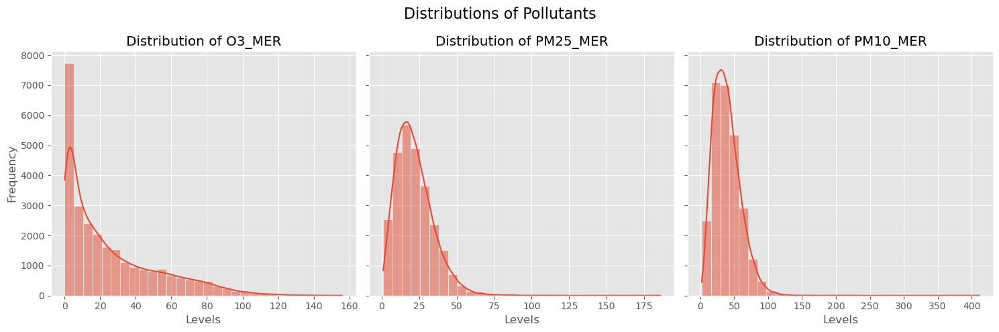

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

pollutants = ['O3_MER', 'PM25_MER', 'PM10_MER']

# Create a grid of histograms
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Distributions of Pollutants', fontsize=16)

for ax, pollutant in zip(axes, pollutants):
    sns.histplot(df_focus[pollutant], kde=True, bins=30, ax=ax)
    ax.set_title(f'Distribution of {pollutant}')
    ax.set_xlabel('Levels')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

**Key Insights:**

1. **Ozone (O3)** shows significant variability, likely influenced by seasonal and daily patterns like sunlight and temperature.
2. **PM2.5 and PM10** exhibit high maximum values (186 and 411 µg/m³, respectively), suggesting extreme pollution events, which are critical to health concerns.
3. **PM10** shows the greatest variability, indicating frequent fluctuations, possibly due to larger particulate sources like dust and construction.

**2. Detect Outliers: Isolation Forest**

In [ ]:
# Use Isolation Forest to detect outliers.
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

# Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
df_focus['Iso_Outlier'] = iso_forest.fit_predict(df_focus[pollutants])
df_focus['Iso_Outlier'] = df_focus['Iso_Outlier'].map({1: 'Inlier', -1: 'Outlier'})

In [ ]:
# Count the Outliers: Summarize the number of outliers detected by Isolation Forest and Local Outlier Factor for each pollutant.
iso_outliers_count = df_focus['Iso_Outlier'].value_counts()

print("Isolation Forest Outliers:")
print(iso_outliers_count)


Isolation Forest Outliers:
Iso_Outlier
Inlier     25448
Outlier     1340
Name: count, dtype: int64


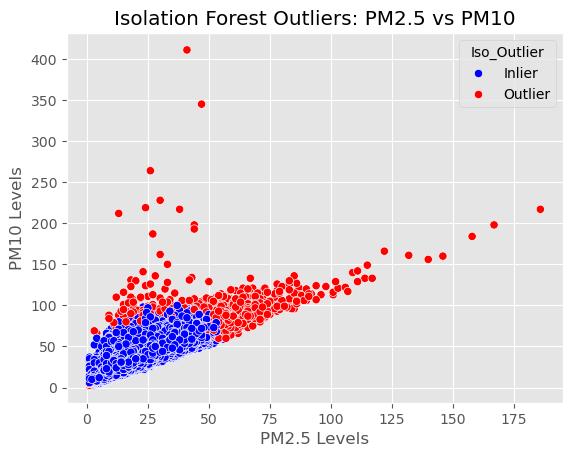

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatterplot for Isolation Forest
sns.scatterplot(data=df_focus, x='PM25_MER', y='PM10_MER', hue='Iso_Outlier', palette={'Inlier': 'blue', 'Outlier': 'red'})
plt.title('Isolation Forest Outliers: PM2.5 vs PM10')
plt.xlabel('PM2.5 Levels')
plt.ylabel('PM10 Levels')
plt.show()


**Findings from Isolation Forest**

- **🔍 Isolation Forest Analysis**
- The **scatterplot** suggests that extreme events for **PM2.5 and PM10** often **coincide**, likely due to shared sources such as:
  - 🚧 Construction dust
  - 🚗 Traffic emissions
  - 🏭 Industrial activities

- **📊 Outlier Counts**
  - **Inliers:** 🟢 25,300
  - **Outliers:** 🔴 1,488
  - **Percentage of Outliers:** ~5-6%, aligning with the contamination setting (0.05).

---

- **📌 Key Insights**

| **Insight** | **Details** |
|------------|--------------------------------------------------------------|
| **🔗 PM2.5 & PM10 Relationship** | - Strong correlation suggests **common pollution sources** like **dust, traffic, and industry**. |
| **🚨 Air Quality Impact** | - **High PM2.5 and PM10 levels** are critical for **air quality management** due to their **direct effects on respiratory health**. |
| **🫁 Health Risks from O3 & PM2.5** | - **Elevated O3 levels**, particularly when combined with **PM2.5 spikes**, may lead to **additional health concerns**. |

---

- **Conclusion**

The **Isolation Forest model** effectively identifies pollution anomalies, revealing that **PM2.5, PM10, and O3 spikes** are driven by shared environmental factors. These findings emphasize the need for targeted air quality management strategies. 🚀


**3. Temporal Analysis of Multivariate Outliers (monthly, yearly)**

In [ ]:
print(df_focus.columns)  # Check all column names


Index(['O3_MER', 'PM25_MER', 'PM10_MER', 'TMP_MER', 'RH_MER', 'WSP_MER',
       'AirQualityIndex', 'datetime', 'PM25_MER_Outlier', 'PM10_MER_Outlier',
       'Iso_Outlier', 'O3_MER_Outlier', 'date', 'month'],
      dtype='object')


In [ ]:
# Ensure the 'date' column is in datetime format
df_focus['date'] = pd.to_datetime(df_focus['datetime'], errors='coerce')

# Extract the month and create a new 'month' column
df_focus['month'] = df_focus['date'].dt.month


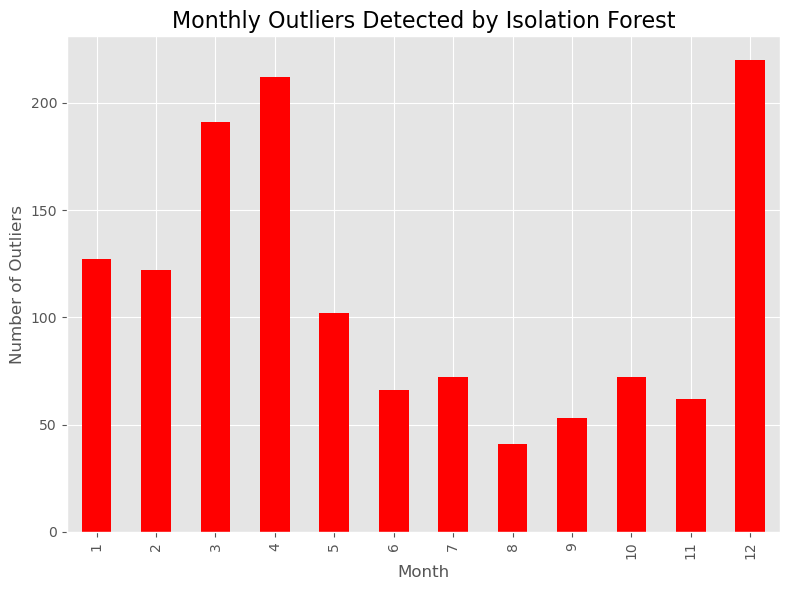

Summary of Monthly Outliers:
    Month  Isolation Forest Outliers
0       1                        127
1       2                        122
2       3                        191
3       4                        212
4       5                        102
5       6                         66
6       7                         72
7       8                         41
8       9                         53
9      10                         72
10     11                         62
11     12                        220


In [ ]:
import matplotlib.pyplot as plt

# Group Isolation Forest outliers by month
iso_monthly_outliers = df_focus[df_focus['Iso_Outlier'] == 'Outlier'].groupby('month').size()

# Create a bar plot for Isolation Forest outliers
fig, ax = plt.subplots(figsize=(8, 6))
iso_monthly_outliers.plot(kind='bar', color='red', ax=ax)
ax.set_title('Monthly Outliers Detected by Isolation Forest', fontsize=16)
ax.set_xlabel('Month')
ax.set_ylabel('Number of Outliers')

plt.tight_layout()
plt.show()

# Print summary of monthly outliers
summary_table = pd.DataFrame({
    'Month': iso_monthly_outliers.index,
    'Isolation Forest Outliers': iso_monthly_outliers.values
})
print("Summary of Monthly Outliers:")
print(summary_table)


**Seasonal Variations:** Isolation Forest shows the highest number of outliers in April (212) and December (220). This suggests seasonal spikes, potentially related to changes in weather or human activity (e.g., colder months or holiday seasons increasing pollution levels).

**Consistent Months for Outliers:** Increase in December, possibly due to increased emissions during winter months or holiday-related activities (e.g., fireworks, increased vehicular traffic). Months like April represent seasonal shifts with heightened pollutant activity.

**Lowest Outliers:** The months with the lowest outliers are August (41) and July (72). These months typically experience fewer pollution events, possibly due to stable weather or reduced human activity during summer.

Grouped Data by Year:
 year
2020     65
2021    559
2022    418
2023    298
dtype: int64


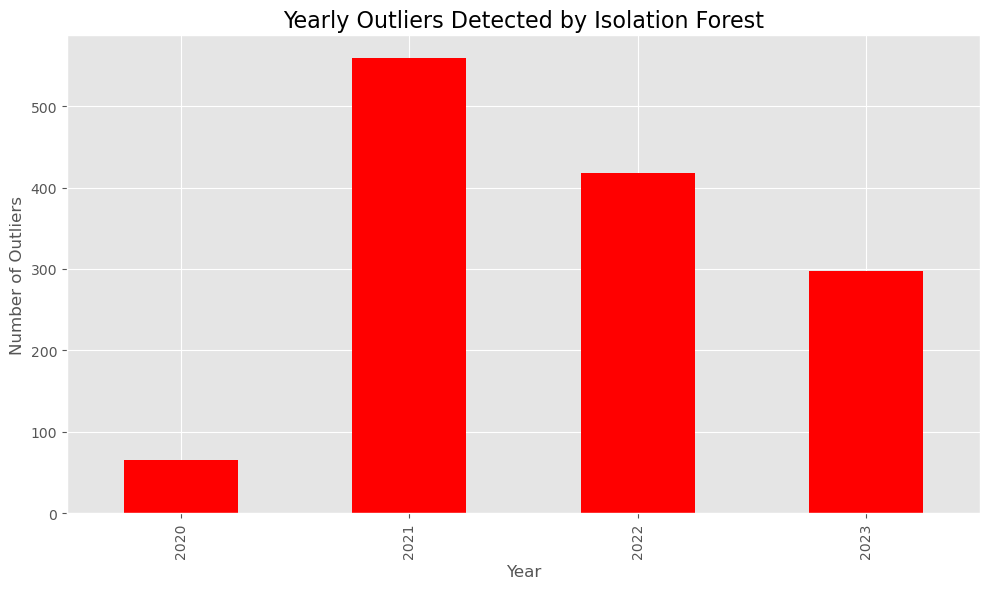


Summary of Yearly Outliers:
   Year  Isolation Forest Outliers
0  2020                         65
1  2021                        559
2  2022                        418
3  2023                        298


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# The 'date' column is datetime and extract 'year'
df_focus['date'] = pd.to_datetime(df_focus['date'], errors='coerce')
df_focus['year'] = df_focus['date'].dt.year

# Group Isolation Forest outliers by year
iso_yearly_outliers = (
    df_focus[df_focus['Iso_Outlier'] == 'Outlier']
    .groupby('year')
    .size()
)

# The grouping result is correct
print("Grouped Data by Year:\n", iso_yearly_outliers)

# Plot Isolation Forest outliers grouped by year
fig, ax = plt.subplots(figsize=(10, 6))
iso_yearly_outliers.plot(kind='bar', color='red', ax=ax)
ax.set_title('Yearly Outliers Detected by Isolation Forest', fontsize=16)
ax.set_xlabel('Year')
ax.set_ylabel('Number of Outliers')
ax.set_xticks(range(len(iso_yearly_outliers.index)))  # Ensure correct x-axis ticks
ax.set_xticklabels(iso_yearly_outliers.index)

plt.tight_layout()
plt.show()

# Create a summary table
summary_table = pd.DataFrame({
    'Year': iso_yearly_outliers.index,
    'Isolation Forest Outliers': iso_yearly_outliers.values
})
print("\nSummary of Yearly Outliers:")
print(summary_table)


**Trends Over the Years:** Highest number of outliers in 2021 (559). Decline in subsequent years: 2022 (418) and 2023 (298).

**2021 as a Critical Year:**
1. Showed significant pollutant anomalies which could indicate environmental conditions, unusual weather patterns; such as temperature inversions or low wind speeds, could have trapped pollutants.
2. Human activity: Post-pandemic changes in industrial or vehicular activity might have contributed to higher pollution.

**5. Correlate Multivariate Outliers with Weather Conditions**

**Analyze Correlation Between Pollutants and Weather Variables:** Analyze how weather variables (e.g., temperature, humidity, wind speed) influence pollutant levels.

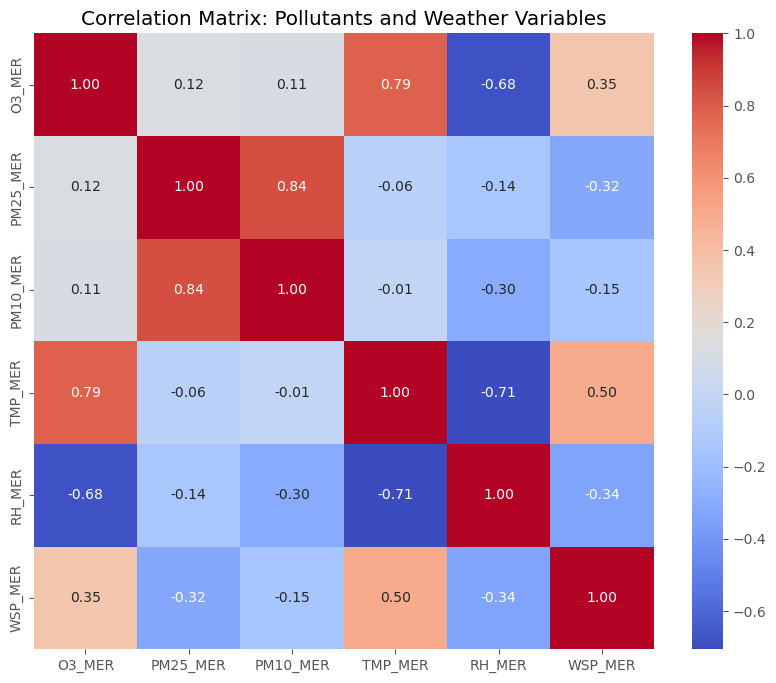

Summary of Correlation Matrix: Pollutants and Weather Variables
            O3_MER  PM25_MER  PM10_MER   TMP_MER    RH_MER   WSP_MER
O3_MER    1.000000  0.124585  0.111093  0.786092 -0.684887  0.354270
PM25_MER  0.124585  1.000000  0.844049 -0.060039 -0.138894 -0.315345
PM10_MER  0.111093  0.844049  1.000000 -0.012220 -0.299566 -0.152641
TMP_MER   0.786092 -0.060039 -0.012220  1.000000 -0.705835  0.495974
RH_MER   -0.684887 -0.138894 -0.299566 -0.705835  1.000000 -0.337953
WSP_MER   0.354270 -0.315345 -0.152641  0.495974 -0.337953  1.000000


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of pollutants and weather variables
pollutants = ['O3_MER', 'PM25_MER', 'PM10_MER']
weather_cols = ['TMP_MER', 'RH_MER', 'WSP_MER']

# Correlation matrix for pollutants and weather variables
correlation_matrix = df_focus[pollutants + weather_cols].corr()

# Visualize correlations using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: Pollutants and Weather Variables')
plt.show()

# Print the correlation matrix summary
print("Summary of Correlation Matrix: Pollutants and Weather Variables")
print(correlation_matrix)

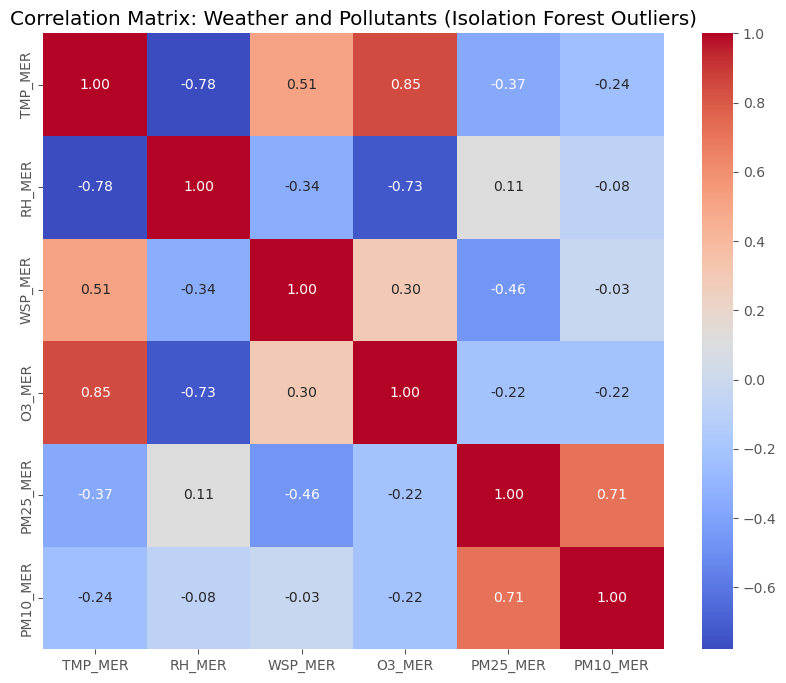

Summary of Correlation Matrix: Weather and Pollutants (Isolation Forest Outliers)
           TMP_MER    RH_MER   WSP_MER    O3_MER  PM25_MER  PM10_MER
TMP_MER   1.000000 -0.778721  0.512670  0.846308 -0.368703 -0.237619
RH_MER   -0.778721  1.000000 -0.343652 -0.731421  0.111138 -0.077339
WSP_MER   0.512670 -0.343652  1.000000  0.303305 -0.459375 -0.025492
O3_MER    0.846308 -0.731421  0.303305  1.000000 -0.220945 -0.221299
PM25_MER -0.368703  0.111138 -0.459375 -0.220945  1.000000  0.711360
PM10_MER -0.237619 -0.077339 -0.025492 -0.221299  0.711360  1.000000


In [ ]:
# Focus on weather conditions during outlier events to see if they contribute to anomalies.
import seaborn as sns
import matplotlib.pyplot as plt

# Filter out Isolation Forest outliers
iso_outliers = df_focus[df_focus['Iso_Outlier'] == 'Outlier']

# Correlation matrix for weather and pollutants during Isolation Forest outlier events
iso_outliers_corr = iso_outliers[weather_cols + pollutants].corr()

# Visualize correlations during outlier events
plt.figure(figsize=(10, 8))
sns.heatmap(iso_outliers_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: Weather and Pollutants (Isolation Forest Outliers)')
plt.show()

# Print the correlation matrix summary
print("Summary of Correlation Matrix: Weather and Pollutants (Isolation Forest Outliers)")
print(iso_outliers_corr)

**Insights**

**Ozone Sensitivity During Outliers:**
1. Extreme ozone events are heavily influenced by high temperatures and low humidity, underscoring the role of heatwaves or dry spells in exacerbating ozone pollution.
2. Wind appears to have a moderate effect, possibly dispersing ozone over larger areas or contributing to transport from external sources.

**Particulate Matter Behavior During Outliers:** PM concentrations decrease with high temperatures and strong winds, highlighting the importance of atmospheric mixing in mitigating extreme particulate pollution.

**Weather-Driven Anomalies:** The correlations during outliers are more pronounced compared to the general dataset, emphasizing the influence of specific weather conditions on extreme pollution events.

**Comparison with General Dataset**
1. **O3:** The correlation with temperature is stronger during outliers (0.846) than in the general dataset (0.786), suggesting that temperature plays a more critical role in driving extreme ozone levels.
2. **PM25 and PM10:** Temperature and wind speed show stronger negative correlations during outliers compared to the general dataset, indicating that weather conditions are more influential during extreme particulate events.

**Group Outliers by Month:** Analyze monthly trends for pollutants with significant outliers.

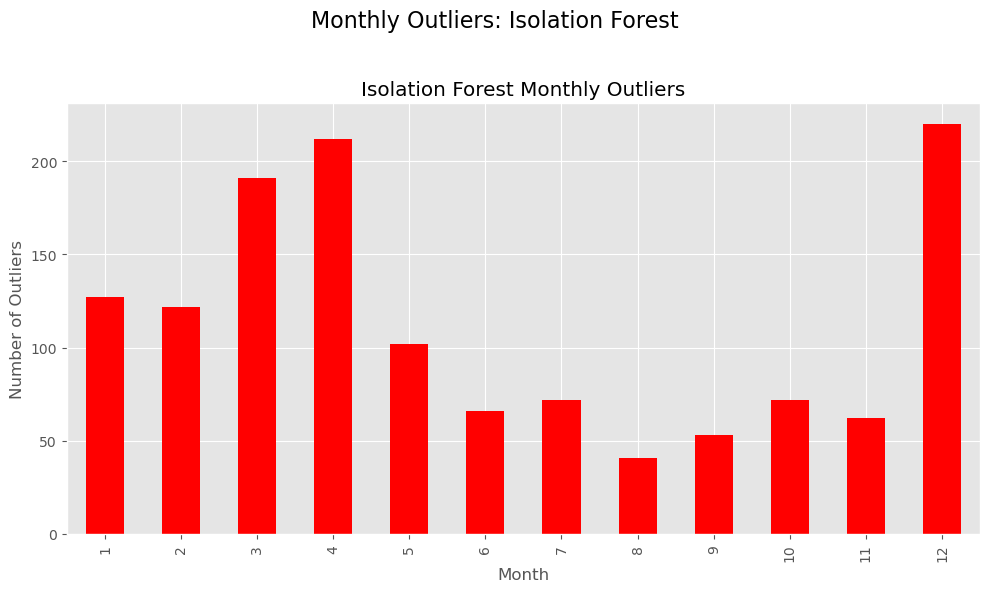

Summary of Monthly Outliers (Isolation Forest):
month
1     127
2     122
3     191
4     212
5     102
6      66
7      72
8      41
9      53
10     72
11     62
12    220
dtype: int64


In [ ]:
# Group Isolation Forest outliers by month
iso_monthly_outliers = df_focus[df_focus['Iso_Outlier'] == 'Outlier'].groupby('month').size()

# Plot monthly trends for Isolation Forest
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
fig.suptitle('Monthly Outliers: Isolation Forest', fontsize=16)

# Isolation Forest monthly trends
iso_monthly_outliers.plot(kind='bar', ax=ax, color='red', title='Isolation Forest Monthly Outliers')
ax.set_xlabel('Month')
ax.set_ylabel('Number of Outliers')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Print summary
print("Summary of Monthly Outliers (Isolation Forest):")
print(iso_monthly_outliers)


**Seasonal Trends:**
1. **December** emerges as a consistent month for high outliers, potentially indicating weather conditions (e.g., stagnant air) that exacerbate pollution.
2. Fewer anomalies decteced during summer months like **July and August,** reflecting improved air quality due to favorable dispersion conditions.

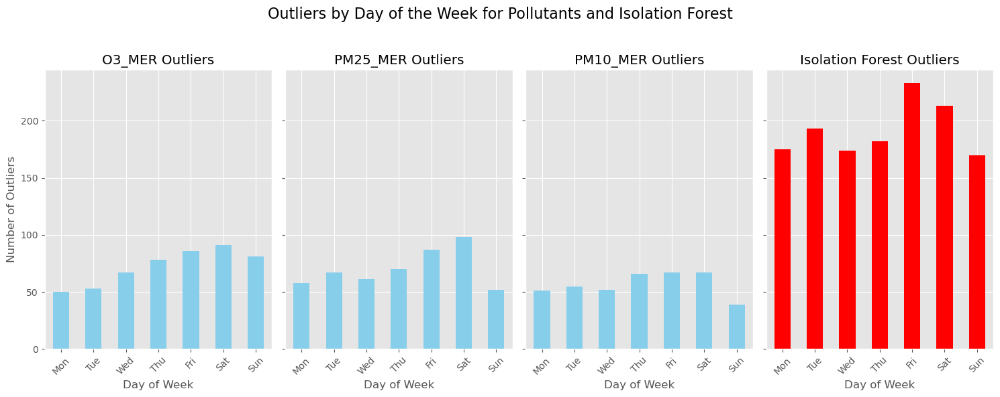

Summary of Daily Outliers for Pollutants:
             O3_MER  PM25_MER  PM10_MER
day_of_week                            
0                50        58        51
1                53        67        55
2                67        61        52
3                78        70        66
4                86        87        67
5                91        98        67
6                81        52        39

Summary of Daily Outliers for Isolation Forest:
day_of_week
0    175
1    193
2    174
3    182
4    233
5    213
6    170
dtype: int32


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Extract day of the week from datetime
df_focus['day_of_week'] = df_focus['datetime'].dt.dayofweek  # Monday = 0, Sunday = 6

# Initialize a DataFrame to store outlier counts for pollutants
daily_outliers_summary = pd.DataFrame()  # For pollutants

# Create a grid layout for bar charts
fig, axes = plt.subplots(1, len(pollutants) + 1, figsize=(15, 6), sharey=True)
fig.suptitle('Outliers by Day of the Week for Pollutants and Isolation Forest', fontsize=16)

# Plot daily outliers for each pollutant
for i, pollutant in enumerate(pollutants):
    daily_outliers = df_focus[df_focus[f'{pollutant}_Outlier']].groupby('day_of_week').size()
    daily_outliers_summary[pollutant] = daily_outliers  # Store results in the summary DataFrame

    # Plot on the grid
    daily_outliers.plot(kind='bar', ax=axes[i], color='skyblue')
    axes[i].set_title(f'{pollutant} Outliers')
    axes[i].set_xlabel('Day of Week')
    axes[i].set_ylabel('Number of Outliers')
    axes[i].set_xticks(range(7))
    axes[i].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)

# Add Isolation Forest outliers to the grid
iso_daily_outliers = df_focus[df_focus['Iso_Outlier'] == 'Outlier'].groupby('day_of_week').size()
iso_daily_outliers.plot(kind='bar', ax=axes[-1], color='red')
axes[-1].set_title('Isolation Forest Outliers')
axes[-1].set_xlabel('Day of Week')
axes[-1].set_xticks(range(7))
axes[-1].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout for the title
plt.show()

# Print the summary of daily outliers
print("Summary of Daily Outliers for Pollutants:")
print(daily_outliers_summary.fillna(0).astype(int))  # Replace NaN with 0 for clarity

print("\nSummary of Daily Outliers for Isolation Forest:")
print(iso_daily_outliers.fillna(0).astype(int))  # Replace NaN with 0 for clarity


**Weekend Effect:** Both pollutant-specific and Isolation Forest methods highlight elevated pollution levels on **Fridays and Saturdays,** possibly due to increased human activity.

**7. Compare Outliers to Air and Health Index:**

Visualize trends in the Air and Health Index and compare with outliers.

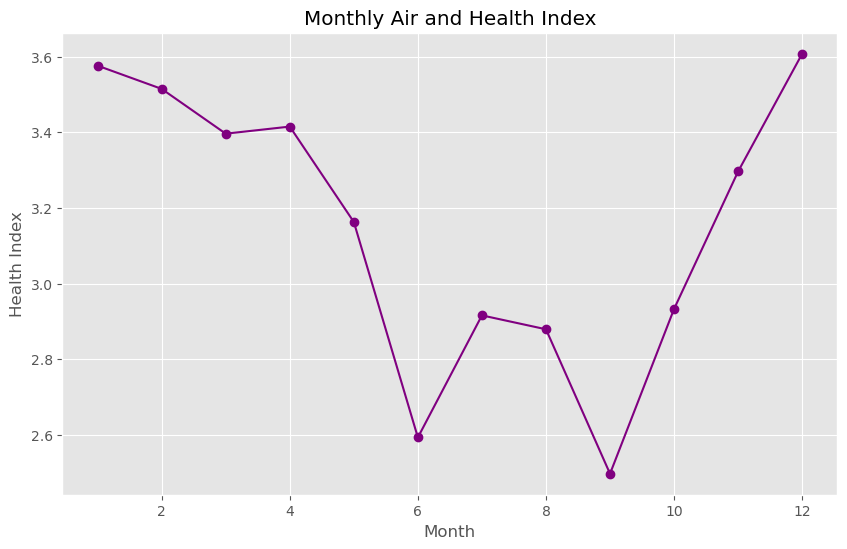

Summary of Monthly Air and Health Index:
month
1     3.575744
2     3.514403
3     3.396057
4     3.414794
5     3.162634
6     2.593056
7     2.915751
8     2.879032
9     2.497222
10    2.932796
11    3.296183
12    3.607397
Name: AirQualityIndex, dtype: float64


In [ ]:
import matplotlib.pyplot as plt

# Calculate average Air and Health Index by month
monthly_health_index = df_focus.groupby('month')['AirQualityIndex'].mean()

# Plot trends in Air and Health Index
plt.figure(figsize=(10, 6))
monthly_health_index.plot(kind='line', title='Monthly Air and Health Index', color='purple', marker='o')
plt.xlabel('Month')
plt.ylabel('Health Index')
plt.grid(True)  # Add grid for better readability
plt.show()

# Print the summary of monthly average Air and Health Index
print("Summary of Monthly Air and Health Index:")
print(monthly_health_index)

**Insights**

**Health Risks in Winter:** Elevated Air and Health Index values in winter correspond to increased pollution levels, particularly particulate matter, posing higher health risks. This could indicate poorer air quality during winter months, likely due to stagnant air conditions and increased emissions from heating.

**Improved Air Quality in Summer:** Lower Air and Health Index values in summer coincide with reduced outliers and better meteorological conditions for pollutant dispersion, possibly due to improved dispersion and lower emissions.

**7. Connect Pollutants to Health Impacts**

Correlate Pollutants with Air and Health Index: Analyze correlations between pollutants and health impacts.

In [ ]:
for pollutant in pollutants:
    correlation = df_focus[pollutant].corr(df_focus['AirQualityIndex'])
    print(f"Correlation between {pollutant} and Air and Health Index: {correlation:.2f}")

Correlation between O3_MER and Air and Health Index: 0.32
Correlation between PM25_MER and Air and Health Index: 0.32
Correlation between PM10_MER and Air and Health Index: 0.35


In [ ]:
# Health Index During Outlier Events: Assess how outlier events affect Air and Health Index
for pollutant in pollutants:
    avg_health_index_outliers = df_focus.loc[df_focus[f'{pollutant}_Outlier'], 'AirQualityIndex'].mean()
    print(f"Average Health Index during {pollutant} outliers: {avg_health_index_outliers:.2f}")

Average Health Index during O3_MER outliers: 4.44
Average Health Index during PM25_MER outliers: 4.09
Average Health Index during PM10_MER outliers: 4.07


In [ ]:
# Average Health Index during Isolation Forest outlier events
avg_aqi_iso_outliers = df_focus.loc[df_focus['Iso_Outlier'] == 'Outlier', 'AirQualityIndex'].mean()
print(f"Average Health Index During Isolation Forest Outliers: {avg_aqi_iso_outliers:.2f}")

Average Health Index During Isolation Forest Outliers: 3.98


**Air Pollution & Health Impact Analysis**

- **📈 Positive Correlation Between Pollutants & Health Index**

| **Pollutant** | **Correlation with Health Index** | **Key Impact** |
|--------------|----------------------------------|---------------------------------------------|
| **🟠 PM10** | **0.35** (Strongest correlation) | Highest health impact, **priority for mitigation** |
| **🟢 O3** | **0.32** (Moderate correlation) | Outliers correspond to **highest Health Index values** |
| **🔵 PM2.5** | **0.32** (Moderate correlation) | Significant impact, but similar to PM10 |

---
<br>

- **🏥 Public Health Implications**
  - **Prioritize PM10 control** due to its **stronger health impact**.
  - **O3 outliers** are associated with **the highest average Health Index**, suggesting a **greater health risk compared to PM2.5 and PM10**.
  - **Elevated Health Index values** indicate a need for **targeted air quality interventions** to protect **vulnerable populations** during **high pollution periods**.

---
<br>

- **🔍 Comparative Analysis of Anomaly Detection Methods**

| **Method** | **Findings** |
|-----------|--------------------------------------------------------------|
| **🧠 Isolation Forest** | - Detects outliers with a **higher associated Health Index**. <br> - May be identifying **more significant health-impacting events**. |
| **📉 LOF (Local Outlier Factor)** | - Identifies anomalies but with a **lower associated Health Index** than Isolation Forest. |

---
<br>

- **🩺 Public Health Considerations from Anomalies**
  - Both methods **highlight periods of elevated health risks**, emphasizing the importance of **air quality anomaly monitoring**.
  - **Proactive anomaly detection** can help mitigate **potential health impacts** by **identifying and addressing pollution spikes early**.

---
<br>

- **Conclusion**

The **correlation between pollutants and the Health Index** underscores the need for **targeted pollution control**. By **prioritizing PM10 management** and using **Isolation Forest for effective anomaly detection**, policymakers can better **protect public health**. 🚀


**9. Overall Findings and Recommendations**

**Analysis of Significant Pollutants with Outliers**

- **📌 Key Pollutants Identified as Outliers**

| **Pollutant** | **Findings & Impact** |
|--------------|--------------------------------------------------------------|
| **🟢 O3 (Ozone)** | - **Consistently flagged as an outlier** by all methods. <br> - Strong correlation with **Air & Health Index increases**. <br> - High oxidation capacity contributes to **respiratory issues** (Molina, 2023; Edomex, 2018). |
| **🟠 PM2.5 & PM10** | - Frequently flagged as **significant outliers**. <br> - Linked to **aggravated asthma, cardiovascular issues**, and **long-term respiratory risks** (Molina, 2023). |

---
<br>

- **🌦 Influence of Weather Conditions**

| **Factor** | **Impact on Pollution Levels** |
|-----------|--------------------------------------------------------------|
| **🔥 Seasonal Patterns** | - **Higher O3 levels (March–May)** due to **increased solar radiation** (Mexico Business News, 2024). |
| **💨 Dry Season Effects** | - **Higher PM2.5 & PM10 levels (Nov–May)** due to **reduced rainfall & biomass burning** (Edomex, 2018). |

---
<br>

- **🔁 Recurring Seasonal Trends & Anomalies**

| **Trend/Anomaly** | **Explanation** |
|------------------|--------------------------------------------------------------|
| **🎇 December Pollution Spikes** | - Driven by **fireworks & bonfires** during **Christmas & New Year** (Molina, 2023). |
| **🦠 COVID-19 Anomalies (2021)** | - Changes in urban activity led to **unique air quality trends**, aligning with global patterns. |

---
<br>

- **📢 Recommendations for Policy & Intervention**

| **Action Area** | **Recommendations** |
|---------------|--------------------------------------------------------------|
| **📜 Pollution Control** | - Implement **targeted policies** for **recurring spikes** (e.g., stricter firework regulations in December) (Edomex, 2018). |
| **📣 Public Awareness** | - Increase **community engagement** on **reducing biomass burning** as part of **ProAire strategies**. |

---
<br>

- **🎯 Focus on Key Pollutants & Data-Driven Monitoring**

| **Recommendation** | **Justification** |
|------------------|--------------------------------------------------------------|
| **🏭 Prioritize O3, PM2.5, & PM10 mitigation** | - These pollutants **pose the highest health risks** and are central to **government policies** (Gov. of Mexico City, 2024). |
| **📊 Utilize Isolation Forest for Anomaly Detection** | - **Most reliable method for detecting pollution anomalies**. <br> - Can be integrated into **predictive models** to proactively manage **high-risk periods**. <br> - Supports **health-focused monitoring systems like SIMAT**. |

---

- **🔎 Conclusion**

This analysis highlights **seasonal pollution trends**, **the influence of weather patterns**, and the **importance of policy-driven interventions**. By **prioritizing key pollutants (O3, PM2.5, PM10)** and leveraging **data-driven anomaly detection**, air quality management can become **more effective and health-focused**. 🚀


## **Feature Analysis**

In [103]:
categories = {1: 'Good', 2: 'Moderate', 3: 'Unhealthy for Sensitive Groups', 4: 'Unhealthy', 5: 'Very Unhealthy'}
df['AirQualityIndex'] = df['AirQualityIndex'].map(categories)


In [101]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['month'] = df['datetime'].dt.month
df['hour'] = df['datetime'].dt.hour

In [ ]:
!pip install altair_data_server
!pip install "vegafusion[embed]>=1.5.0"
!pip install "vl-convert-python>=1.6.0"

In [ ]:
alt.data_transformers.enable('vegafusion') #necessary server for large datasets

In [104]:
# Group by 'hour' and 'AirQualityIndex' to count occurrences
hourly_aqi = df.groupby(['hour', 'AirQualityIndex']).size().reset_index(name='count')

# Pivot the data for easier analysis
hourly_aqi_pivot = hourly_aqi.pivot(index='hour', columns='AirQualityIndex', values='count').fillna(0)

In [105]:
chart = alt.Chart(df).mark_bar().encode(
    x=alt.X('hour:O', title='Hour of the Day'),
    y=alt.Y('PM25_MER:Q', title='PM25 Levels'),
    color=alt.Color('AirQualityIndex:N', title='Air Quality Index'),
    tooltip=['hour', 'AirQualityIndex', 'PM25_MER']
).properties(
    title="PM25 Levels with Air Quality Index Categories",
    width=600,
    height=400
)

# Display the chart
chart.show()

alt.Chart(...)

Feature Importance:
    Feature  Importance
7   TMP_MER    0.116715
8   WDR_MER    0.115703
6    RH_MER    0.108736
3    O3_MER    0.106594
1  PM10_MER    0.104310
4   NO2_MER    0.103116
5    CO_MER    0.102236
0  PM25_MER    0.094105
9   WSP_MER    0.088096
2   SO2_MER    0.060390


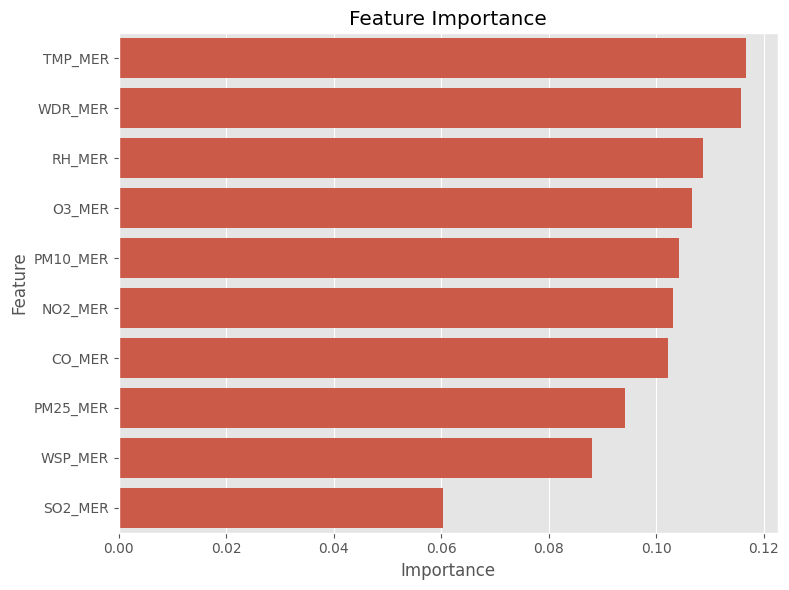

In [107]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

X = df[['PM25_MER', 'PM10_MER', 'SO2_MER', 'O3_MER', 'NO2_MER', 'CO_MER', 'RH_MER', 'TMP_MER', 'WDR_MER', 'WSP_MER']]
y = df['AirQualityIndex']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Feature importance
importances = model.feature_importances_
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importances}).sort_values(by='Importance', ascending=False)

# Print feature importance
print("Feature Importance:")
print(feature_importance)

# Plot feature importance
plt.figure(figsize=(8, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()